In [1]:
from pathlib import Path
# import json
# import configparser
import pprint
pp = pprint.PrettyPrinter(indent=4);
import time
import math
from collections import namedtuple

# # pip install slicerio
# import slicerio.server

# # packages for 3d
# #   # for OCT 3D stuff and using in jupyter
# #   - trame-jupyter-extension
# #   - trame
# #   - trame-vtk
# #   - trame-vuetify
# #   - ipywidgets

import matplotlib.pyplot as plt
import plotly.express as px

# interactive panels
import panel as pn
pn.extension('plotly');

import numpy as np
import pandas as pd
import addict

import cv2
import skimage
import scipy.signal

import pyvista as pv
from PIL import Image
import SimpleITK as sitk

# with vedo
#from vedo import dataurl, Volume, Text2D
import vedo
vedo.settings.default_backend = 'vtk'
#from vedo.applications import Slicer3DPlotter
import naatos_oct_tools.plotters.vedo_plotters as vedo_plotters
import naatos_oct_tools.plotters.sitk_plotters as sitk_plotters

import naatos_oct_tools.thorlabs_oct_file_reading

In [2]:
# Magics to autoreload submodules when they are modified
%load_ext autoreload
%autoreload 2

In [3]:
#%% Load OCT study information
#folder_octexport_root = Path(r'\\file.corp.ghlabs.org\Shared\Projects\NAATOS\V1\NAATOS_OCT_WORK\OCTExport')
folder_octexport_root = Path(r'D:\SGProjects\NAATOS\OCTlocal')
# this is also folder name

# strip 14
study_name = 'GHL_pyapp_20250326T1416'
#study_name = 'GHL_pyapp_20250327T1450'

octstudy = naatos_oct_tools.thorlabs_oct_file_reading.OCT_Study_Folder(study_name,folder_octexport_root);

STUDY: GHL_pyapp_20250326T1416
{   'study_has_an_ini_file': True,
    'study_has_json_info_file': True,
    'study_has_yat_log': False,
    'study_num_jpg_files': 0,
    'study_num_oct_files': 20,
    'study_num_vtk_files': 0}


In [4]:
octstudy.num_oct_files

20

In [5]:
octstudy

<OCT_Study_Folder Object>
GHL_pyapp_20250326T1416 in folder D:/SGProjects/NAATOS/OCTlocal
{   'study_has_an_ini_file': True,
    'study_has_json_info_file': True,
    'study_has_yat_log': False,
    'study_num_jpg_files': 0,
    'study_num_oct_files': 20,
    'study_num_vtk_files': 0}

# Load all OCT files

In [6]:
octstudy.load_all_octs(make_pv_volume=True);    # we will use the pyvista volumes a bit later for debuggin

Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0

In [7]:
# export individual vtk files
if False:
    for count,octdata in enumerate(octstudy.octdatalist):
        octdata.pvvol.save(octstudy.folder_study_processed/'{:s}_saveasvtk_{:04d}.vtk'.format(octstudy.study_name,count));

# Stack And Merge All OCT Volumes To A VTK using PYVISTA

In [8]:
mergedvol = octstudy.pv_stack_all_volumes_along_dimension(dimension=1);

SingleFOV --> Image Dims:(690, 450, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)
Combined --> Image Dims:(690, 9000, 350) PixelSpacing[mm]:(0.003475, 0.02, 0.02)


In [12]:
print(mergedvol)

ImageData (0x1789b64f700)
  N Cells:      2163908539
  N Points:     2173500000
  X Bounds:     0.000e+00, 2.394e+00
  Y Bounds:     0.000e+00, 1.800e+02
  Z Bounds:     0.000e+00, 6.980e+00
  Dimensions:   690, 9000, 350
  Spacing:      3.475e-03, 2.000e-02, 2.000e-02
  N Arrays:     1


In [14]:
# write out stacked .vtk file for opening in slicer
octstudy.folder_study_processed.mkdir(exist_ok=True);
fname = octstudy.folder_study_processed/'{:s}_STACKED.vtk'.format(octstudy.name);
if(fname.exists()):
    print('Stacked volume .vtk file already exists, will not recreate.');
else:
    mergedvol.save(fname);

Stacked volume .vtk file already exists, will not recreate.


# Prepare To Extract Useful Information

In [28]:
data_extracted = addict.Addict();

# Processing Step 0 - Replace VTK scalars with scaled bytes

In [15]:
# make vedo volume
vdvol = vedo.Volume(mergedvol);

In [16]:
# restrict range and re-scale, cast to integer (will reduce memory by 4x)
oct_scalar_min = 30;
oct_scalar_max = 60;
scalars_rescaled_as_int = skimage.util.img_as_ubyte( (np.clip(vdvol.dataset.active_scalars,a_min=oct_scalar_min,a_max=oct_scalar_max)-oct_scalar_min)/(oct_scalar_max-oct_scalar_min) )

vdvol.dataset['OCTintensity'] = scalars_rescaled_as_int;

In [ ]:
# # save this byte-adjusted volume
# fname = octstudy.folder_study_processed/'{:s}_STACKED_uint8.vtk'.format(octstudy.name);
# #vdvol.dataset.save()
# if(fname.exists()):
#     print('Stacked volume byte-size .vtk file already exists, will not recreate.');
# else:
#     mergedvol.save(fname);

Stacked volume byte-size .vtk file already exists, will not recreate.


# Processing Step X - Cast In-Memory Views To SimpleITK Types

In [20]:
# Get ITK image without requiring new memory
import itk
import vtk

# create itk_image
itk_image = itk.image_from_vtk_image(vdvol.dataset)

# itk_image
print(itk_image)

Image (000001789AEF1F80)
  RTTI typeinfo:   class itk::Image<unsigned char,3>
  Reference Count: 1
  Modified Time: 9
  Debug: Off
  Object Name: 
  Observers: 
    none
  Source: (none)
  Source output name: (none)
  Release Data: Off
  Data Released: False
  Global Release Data: Off
  PipelineMTime: 0
  UpdateMTime: 0
  RealTimeStamp: 0 seconds 
  LargestPossibleRegion: 
    Dimension: 3
    Index: [0, 0, 0]
    Size: [690, 9000, 350]
  BufferedRegion: 
    Dimension: 3
    Index: [0, 0, 0]
    Size: [690, 9000, 350]
  RequestedRegion: 
    Dimension: 3
    Index: [0, 0, 0]
    Size: [690, 9000, 350]
  Spacing: [0.003475, 0.02, 0.02]
  Origin: [0, 0, 0]
  Direction: 
1 0 0
0 1 0
0 0 1

  IndexToPointMatrix: 
0.003475 0 0
0 0.02 0
0 0 0.02

  PointToIndexMatrix: 
287.77 0 0
0 50 0
0 0 50

  Inverse Direction: 
1 0 0
0 1 0
0 0 1

  PixelContainer: 
    ImportImageContainer (000001789AC96720)
      RTTI typeinfo:   class itk::ImportImageContainer<unsigned __int64,unsigned char>
      Re

In [21]:
itk_image.GetImageDimension()

3

In [22]:
# make simpleitk image
def itkToSimpleITK(itk_image):
    new_sitk_image = sitk.GetImageFromArray(itk.GetArrayViewFromImage(itk_image),isVector=itk_image.GetNumberOfComponentsPerPixel()>1);
    new_sitk_image.SetOrigin(tuple(itk_image.GetOrigin()))
    new_sitk_image.SetSpacing(tuple(itk_image.GetSpacing()))
    new_sitk_image.SetDirection(itk.GetArrayFromMatrix(itk_image.GetDirection()).flatten()) 
    return new_sitk_image;
simgmerged = itkToSimpleITK(itk_image);

# Processing Step 1 - Automatic Find Bounds Of Strip

In [23]:
size = simgmerged.GetSize()
print(simgmerged.GetSize())

(690, 9000, 350)


In [37]:
# Do Binary Threhsolding On Entire Volume Image
step1_binarythresholding_lo = 250;
step1_binarythresholding_hi = 255;
seg = sitk.BinaryThreshold(
    simgmerged, lowerThreshold=step1_binarythresholding_lo, upperThreshold=step1_binarythresholding_hi, insideValue=1, outsideValue=0
)


In [38]:
# Get numpy array view from simpleitk image (shares memory)
print(seg.GetSize())
nda = sitk.GetArrayViewFromImage(seg);
print(nda.shape)
# note the dimensions permute

(690, 9000, 350)
(350, 9000, 690)


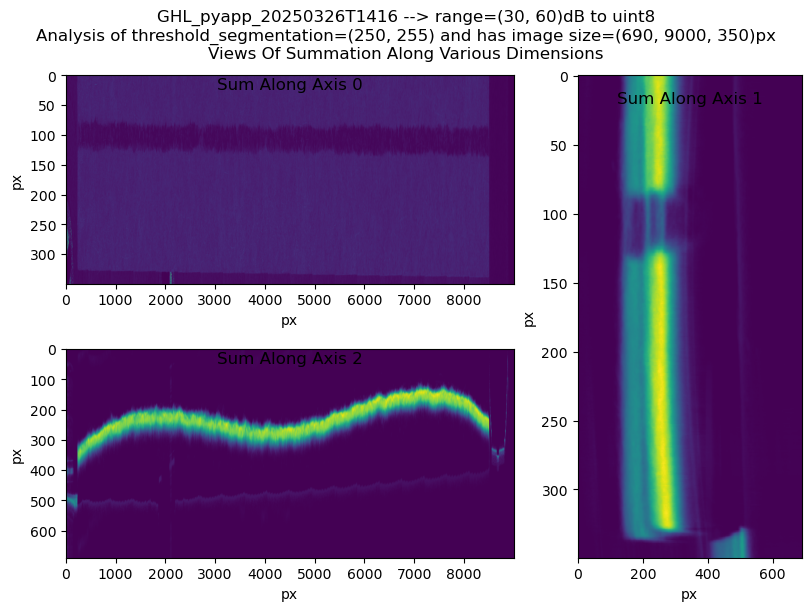

In [39]:
# Show 2d images of summation along each dimension

ndasum0 = nda.sum(axis=0)
ndasum1 = nda.sum(axis=1)
ndasum2 = nda.sum(axis=2)

fig = plt.figure(figsize=(8,6),constrained_layout=True);
fig.suptitle(
"""{:s} --> range={:s}dB to uint8
Analysis of threshold_segmentation={:s} and has image size={:s}px
Views Of Summation Along Various Dimensions""" \
    .format(
        octstudy.name,
        str((oct_scalar_min,oct_scalar_max)),
        str((step1_binarythresholding_lo,step1_binarythresholding_hi)),
        str(seg.GetSize())
    )
)
gs = fig.add_gridspec(2,3);

fig_ax1 = fig.add_subplot(gs[0,0:2]);
fig_ax1.set_title('Sum Along Axis 0',y=0.95,verticalalignment='top')
fig_ax1.imshow(ndasum2,aspect='auto');
fig_ax1.set_xlabel('px');
fig_ax1.set_ylabel('px');

fig_ax2 = fig.add_subplot(gs[:,2]);
fig_ax2.set_title('Sum Along Axis 1',y=0.95,verticalalignment='top')
fig_ax2.imshow(ndasum1,aspect='auto');
fig_ax2.set_xlabel('px');
fig_ax2.set_ylabel('px');

fig_ax3 = fig.add_subplot(gs[1,0:2]);
fig_ax3.set_title('Sum Along Axis 2',y=0.95,verticalalignment='top')
fig_ax3.imshow(ndasum0.T,aspect='auto');
fig_ax3.set_xlabel('px');
fig_ax3.set_ylabel('px');

fig.savefig(octstudy.folder_study_processed/'processing_step1a_{:s}.jpg'.format(time.strftime('%Y%m%d')))

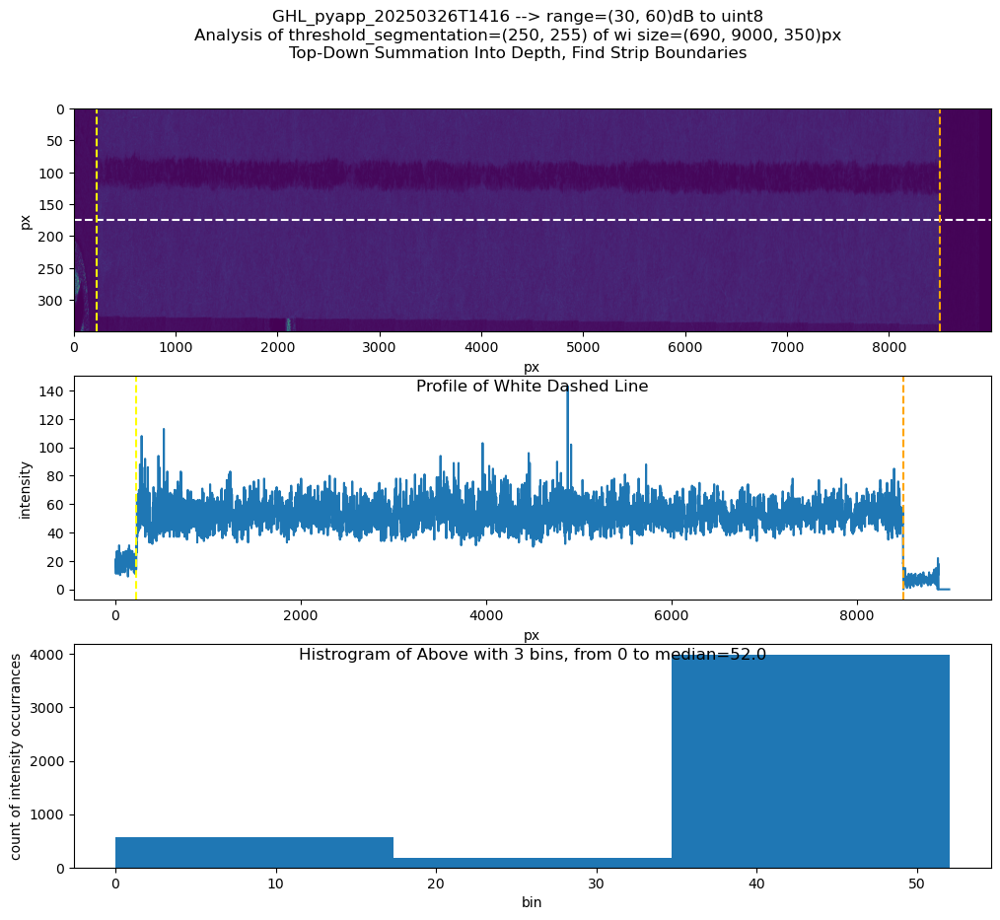

In [40]:
# Do Automatic Analysis Using Line Down the Middle Of Strip
fig,ax = plt.subplots(3,1,figsize=(12,10),squeeze=False);
fig.suptitle(
"""{:s} --> range={:s}dB to uint8
Analysis of threshold_segmentation={:s} of wi size={:s}px
Top-Down Summation Into Depth, Find Strip Boundaries""" \
    .format(
        octstudy.name,
        str((oct_scalar_min,oct_scalar_max)),
        str((step1_binarythresholding_lo,step1_binarythresholding_hi)),
        str(seg.GetSize())
    )
)

ndasum2 = nda.sum(axis=2);
ax[0,0].imshow(ndasum2,aspect='auto');
ax[0,0].axhline(ndasum2.shape[0]//2,color='white',linestyle='dashed')
ax[0,0].set_xlabel('px')
ax[0,0].set_ylabel('px')

ax[1,0].set_title('Profile of White Dashed Line',y=0.95,verticalalignment='top')
a_whiteline = ndasum2[ndasum2.shape[0]//2,:].copy();
ax[1,0].plot(a_whiteline);
ax[1,0].set_xlabel('px')
ax[1,0].set_ylabel('intensity')

# bin histogram along white line, into 3 bins, with the median being the upper range
median = np.median(a_whiteline)
ax[2,0].set_title('Histrogram of Above with 3 bins, from 0 to median={:}'.format(median),y=0.95,verticalalignment='top')
histret,histedges,_ = ax[2,0].hist(a_whiteline,bins=3,range=(0,median))
ax[2,0].set_xlabel('bin')
ax[2,0].set_ylabel('count of intensity occurrances')

# take the value in middle of 2nd bin
threshold_value = (histedges[2]+histedges[1])/2;

# look for sharp edges transitioning where these bins occur
a_whiteline[a_whiteline<threshold_value] = 0
a_whiteline[a_whiteline>=threshold_value] = 1
transition_edges = np.where(a_whiteline[:-1] != a_whiteline[1:])[0]
# for right edge, start at middle and find right-most
edge_right = transition_edges[transition_edges>(ndasum2.shape[1]//2)][0];
edge_left = transition_edges[transition_edges<=(ndasum2.shape[1]//2)][-1];

ax[0,0].axvline(edge_left,color='yellow',linestyle='dashed')
ax[0,0].axvline(edge_right,color='orange',linestyle='dashed')
ax[1,0].axvline(edge_left,color='yellow',linestyle='dashed')
ax[1,0].axvline(edge_right,color='orange',linestyle='dashed')

# store useful information
data_extracted['auto_bounds']['topdown_edge_left_px'] = edge_left.item();
data_extracted['auto_bounds']['topdown_edge_right_px'] = edge_right.item();

# save figure
fig.savefig(octstudy.folder_study_processed/'processing_step1b_{:s}.jpg'.format(time.strftime('%Y%m%d')))

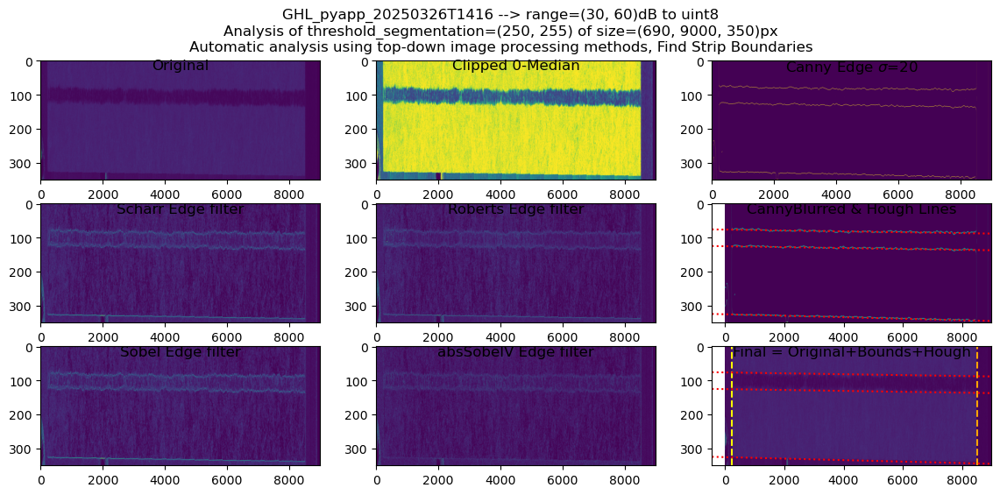

In [41]:
# Do automatic analysis using top-down image processing methods

fig,ax = plt.subplots(3,3,figsize=(14,6),squeeze=False);

fig.suptitle(
"""{:s} --> range={:s}dB to uint8
Analysis of threshold_segmentation={:s} of size={:s}px
Automatic analysis using top-down image processing methods, Find Strip Boundaries""" \
    .format(
        octstudy.name,
        str((oct_scalar_min,oct_scalar_max)),
        str((step1_binarythresholding_lo,step1_binarythresholding_hi)),
        str(seg.GetSize())
    )
)

#image = ndasum2[:,edge_left:edge_right];
image = ndasum2

ax[0,0].set_title('Original',y=0.95,verticalalignment='top')
ax[0,0].imshow(image,aspect='auto')

ax[0,1].set_title('Clipped 0-Median',y=0.95,verticalalignment='top')
image2 = np.clip(image,a_min=0,a_max=median)
ax[0,1].imshow(image2,aspect='auto')

ax[1,0].set_title('Scharr Edge filter',y=0.95,verticalalignment='top')
edge_scharr = skimage.filters.scharr(image2);
ax[1,0].imshow(edge_scharr,aspect='auto')

ax[1,1].set_title('Roberts Edge filter',y=0.95,verticalalignment='top')
edge_roberts = skimage.filters.roberts(image2);
ax[1,1].imshow(edge_roberts,aspect='auto')

ax[2,0].set_title('Sobel Edge filter',y=0.95,verticalalignment='top')
edge_sobel = skimage.filters.sobel(image2);
ax[2,0].imshow(edge_sobel,aspect='auto')

ax[2,1].set_title('absSobelV Edge filter',y=0.95,verticalalignment='top')
edge_sobelv = skimage.filters.sobel_v(image2);
ax[2,1].imshow(abs(edge_sobelv),aspect='auto')

ax[0,2].set_title(r'Canny Edge $\sigma$=20',y=0.95,verticalalignment='top')
edge_canny = skimage.feature.canny(image2,sigma=20,low_threshold=0.45,high_threshold=0.55)
ax[0,2].imshow(edge_canny.view(dtype=np.uint8),aspect='auto')


# contours = skimage.measure.find_contours(edge_canny.view(dtype=np.uint8),level=0.5)
# for contour in contours:
#     ax[1,2].plot(contour[:, 1], contour[:, 0], linewidth=2)
# ax[1,2].yaxis.set_inverted(True)

# -- find some boundaries on topdown view using image processing methods
# houghline finding
ax[1,2].set_title(r'CannyBlurred & Hough Lines',y=0.95,verticalalignment='top')
img_blured_edges = cv2.blur(edge_canny.view(dtype=np.uint8)*255,(3,3));
ax[1,2].imshow(img_blured_edges,aspect='auto')

# Straight-line Hough transform
# Set a precision of Scan a 10 degree angle off the normal (this seems to be 90 degrees with this skimage implementation for horizontal-like lines) with resolution of 0.05 degrees.
tested_angles = np.linspace(math.radians(90-10),math.radians(90+10),int( (math.radians(10)*2)/math.radians(0.05) ), endpoint=True)
h, theta, d = skimage.transform.hough_line(img_blured_edges, theta=tested_angles)
hough_line_data = skimage.transform.hough_line_peaks(h, theta, d);
for _, angle, dist in zip(*hough_line_data):
    (x0, y0) = dist * np.array([np.cos(angle), np.sin(angle)])
    ax[1,2].axline((x0, y0), slope=np.tan(angle + np.pi / 2), color='red',linestyle='dotted')

# Calculate a boundary from sum along strip width
along_strip_sum=ndasum2.sum(axis=0);
along_strip_sum_derivative = scipy.signal.savgol_filter(along_strip_sum,window_length=32,polyorder=3,deriv=1)
edge_topdown_left2 = np.argmax(along_strip_sum_derivative);
edge_topdown_right2 = np.argmin(along_strip_sum_derivative);
ax[2,2].set_title(r'Final = Original+Bounds+Hough',y=0.95,verticalalignment='top')
ax[2,2].imshow(image,aspect='auto');
ax[2,2].axvline(edge_topdown_left2,color='yellow',linestyle='--')
ax[2,2].axvline(edge_topdown_right2,color='orange',linestyle='--')
for _, angle, dist in zip(*hough_line_data):
    (x0, y0) = dist * np.array([np.cos(angle), np.sin(angle)])
    ax[2,2].axline((x0, y0), slope=np.tan(angle + np.pi / 2), color='red',linestyle='dotted')

# Extract relevant data
data_extracted['auto_bounds']['topdown_edge_left_px2'] = edge_topdown_left2.item();
data_extracted['auto_bounds']['topdown_edge_right_px2'] = edge_topdown_right2.item();
data_extracted['auto_topdown_houghline'] = hough_line_data;

# Save to processed folder
fig.savefig(octstudy.folder_study_processed/'processing_step1c_{:s}.jpg'.format(time.strftime('%Y%m%d')))

In [46]:
pp.pprint(data_extracted)

{   'auto_bounds': {   'topdown_edge_left_px': 226,
                       'topdown_edge_left_px2': 229,
                       'topdown_edge_right_px': 8500,
                       'topdown_edge_right_px2': 8501},
    'auto_topdown_houghline': (   array([6252, 5150, 4801], dtype=uint64),
                                  array([1.57298346, 1.5721086 , 1.5721086 ]),
                                  array([325., 125.,  76.]))}


# Processing Step X - Analyze Each Cross-section Along Strip

In [63]:
# Use the automatically determined boundaries along the strip to restrict the depth
# The automatically determined boundaries are too lenient, and initial cross-sections looks funny
seg_sliced = seg[:,data_extracted['auto_bounds']['topdown_edge_left_px2']:data_extracted['auto_bounds']['topdown_edge_right_px2'],:]

seg_sliced.GetSize()

(690, 8272, 350)

pks1 (array([200, 220, 235, 239, 242, 260, 262, 279, 294, 298, 483, 495]), {'peak_heights': array([0.77260245, 0.90499272, 0.29455556, 0.25670599, 0.21659782,
       0.30024666, 0.29729264, 0.39830901, 0.13118072, 0.13460133,
       0.24802223, 0.35218283]), 'prominences': array([7.47252519e-01, 9.04992719e-01, 3.95286636e-02, 1.33971292e-02,
       4.75497043e-05, 2.44964189e-01, 8.05373117e-04, 3.77303932e-01,
       5.73568308e-04, 3.04823323e-02, 2.27644209e-01, 3.52182829e-01]), 'left_bases': array([166, 166, 231, 238, 241, 249, 261, 270, 291, 291, 434, 434]), 'right_bases': array([212, 403, 249, 249, 249, 270, 270, 403, 295, 403, 488, 557])})
widths1 (array([ 0.50253165, 10.55882562,  0.55311642, 11.52462353,  0.52255727,
        8.48329324,  6.64656524,  7.59160768]), array([0.21657404, 0.17776457, 0.29688995, 0.20965705, 0.13089393,
       0.11936016, 0.13420012, 0.17609141]), array([241.5       , 255.53075513, 261.5       , 274.45524902,
       293.97744273, 293.0702431 , 479.

(SliceDataCrossSection(pixel_depth_strip_top_sum_threshold=100, pixel_depth_strip_top=209, pixel_depth_strip_bot=273, pixel_depth_wax_center=np.int64(242), px_wax_transverse_edges=(81.8010752688172, 122.12790697674419), wax_top_seed_candidate_px=(218, 101)),
 <Figure size 1200x800 with 6 Axes>)

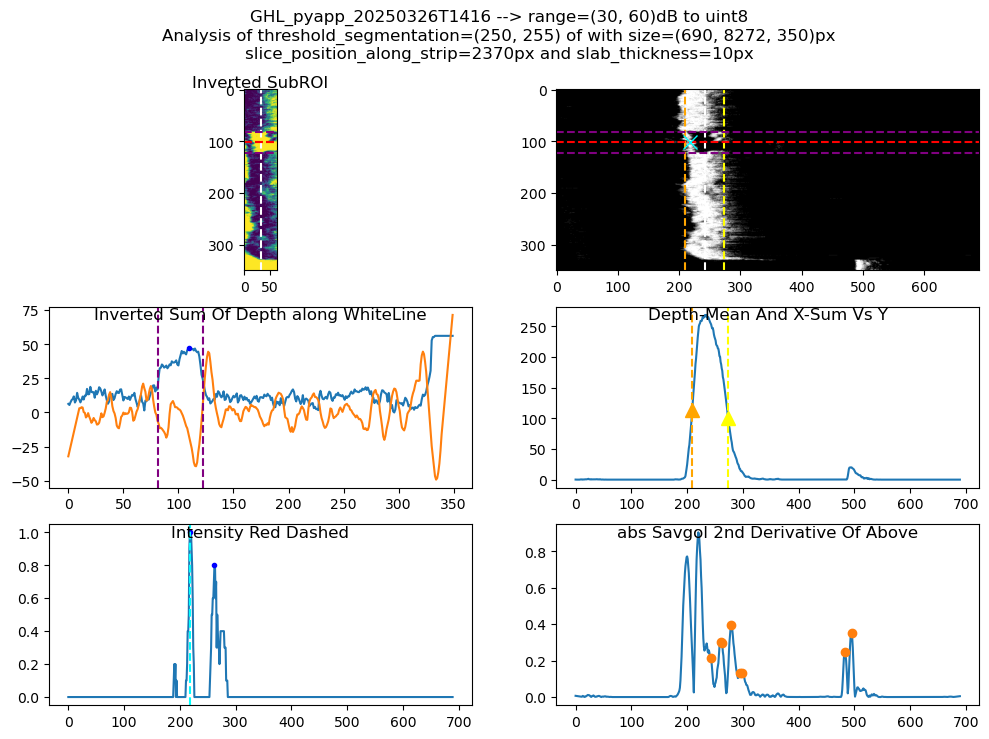

In [85]:
SliceDataCrossSection = namedtuple('SliceDataCrossSection','pixel_depth_strip_top_sum_threshold pixel_depth_strip_top pixel_depth_strip_bot pixel_depth_wax_center px_wax_transverse_edges wax_top_seed_candidate_px')
def process_a_crosssection_slice(seg : sitk.Image, slab_thickness_px,slice_position_along_strip_px, mkplot=True):
    slab_thickness = slab_thickness_px;
    
    if(slab_thickness>1):
        #seg_subset = seg[:,seg.GetSize()[1]//2-slab_thickness//2:seg.GetSize()[1]//2+slab_thickness//2,:]
        seg_subset = seg[:,slice_position_along_strip_px-slab_thickness//2:slice_position_along_strip_px+slab_thickness//2,:]
    else:
        seg_subset = seg[:,slice_position_along_strip_px:slice_position_along_strip_px+1,:]

    nda = sitk.GetArrayFromImage(seg_subset);

    nda_mean = np.mean(nda,axis=1);
    nda_mean_sum = np.sum(nda_mean,axis=0);
    #np.nonzero(nda_mean_sum>5)[0];

    if mkplot:
        fig,ax = plt.subplots(3,2,figsize=(12,8));
        ax[0,1].imshow(nda_mean,aspect='auto',cmap='grey');
        ax[1,1].plot(nda_mean_sum);
    if mkplot:
        fig.suptitle('{:s} --> range={:s}dB to uint8\nAnalysis of threshold_segmentation={:s} of with size={:s}px\nslice_position_along_strip={:.0f}px and slab_thickness={:.0f}px'.format(octstudy.name,str((oct_scalar_min,oct_scalar_max)),str((250,255)),str(seg.GetSize()),slice_position_along_strip_px,slab_thickness_px))


    pixel_depth_strip_top_sum_threshold = 100;
    pixel_depth_strip_top = np.nonzero(nda_mean_sum>pixel_depth_strip_top_sum_threshold)[0][0];
    pixel_depth_strip_bot = np.nonzero(nda_mean_sum>pixel_depth_strip_top_sum_threshold)[0][-1];

    if mkplot:
        ax[1,1].set_title('Depth-Mean And X-Sum Vs Y',y=0.95,verticalalignment='top')
        ax[1,1].plot(pixel_depth_strip_top, nda_mean_sum[pixel_depth_strip_top] , marker='^', markersize=10,color='orange');
        ax[0,1].axvline(pixel_depth_strip_top,linestyle='--',color='orange');
        ax[1,1].axvline(pixel_depth_strip_top,linestyle='--',color='orange');
        ax[1,1].plot(pixel_depth_strip_bot, nda_mean_sum[pixel_depth_strip_bot] , marker='^', markersize=10,color='yellow');
        ax[1,1].axvline(pixel_depth_strip_bot,linestyle='--',color='yellow');
        ax[0,1].axvline(pixel_depth_strip_bot,linestyle='--',color='yellow');

    if mkplot:
        ax[0,0].set_title('Inverted SubROI',y=0.95,verticalalignment='bottom')
    imgtmp = nda_mean[:,pixel_depth_strip_top:pixel_depth_strip_bot];


    if mkplot:
        ax[0,0].imshow(np.max(imgtmp)-imgtmp);


    nda_mean_sum_curvature = scipy.signal.savgol_filter(nda_mean_sum,21,polyorder=3,deriv=2);
    pks = scipy.signal.find_peaks(abs(nda_mean_sum_curvature),height=0.1,prominence=0)
    # restrict peaks to be right of the white line
    pksculled=pks[0][ pks[0]> round( (pixel_depth_strip_bot-pixel_depth_strip_top)/2 + pixel_depth_strip_top ) ] # halfway between orange and yellow
    widths = scipy.signal.peak_widths(abs(nda_mean_sum_curvature),pksculled,rel_height=0.5)
    print('pks1',pks)
    print('widths1',widths)
    if mkplot:
        #ax[2,1].plot(np.diff(nda_mean_sum,1));
        ax[2,1].set_title('abs Savgol 2nd Derivative Of Above',y=0.95,verticalalignment='top')
        ax[2,1].plot(abs(nda_mean_sum_curvature));
        ax[2,1].plot(pksculled,abs(nda_mean_sum_curvature[pksculled]),'o',linestyle='');
    
    #pixel_depth_wax_center = round( (pixel_depth_strip_bot-pixel_depth_strip_top)/2 + pixel_depth_strip_top )
    pixel_depth_wax_center = pksculled[0];
    if mkplot:
        ax[0,1].axvline(pixel_depth_wax_center,linestyle='--',color='white');
        ax[0,0].axvline(pixel_depth_wax_center-pixel_depth_strip_top,linestyle='--',color='white');
    
    if mkplot:
        ax[1,0].set_title('Inverted Sum Of Depth along WhiteLine',y=0.95,verticalalignment='top');

    sum_of_depth_intensities = np.sum(imgtmp,axis=1);
    sum_of_depth_intensities = max(sum_of_depth_intensities) - sum_of_depth_intensities;
    if mkplot:
        ax[1,0].plot(sum_of_depth_intensities)
        ax[1,0].plot( scipy.signal.savgol_filter(sum_of_depth_intensities,21,polyorder=3,deriv=2)*100 );
    #pks = scipy.signal.find_peaks(sum_of_depth_intensities,width=20,prominence=1.2)
    pks = scipy.signal.find_peaks(sum_of_depth_intensities,height=25,prominence=25)
    widths = scipy.signal.peak_widths(sum_of_depth_intensities,pks[0],rel_height=0.5)
    print(pks)
    print(widths)
    
    if mkplot:
        ax[1,0].plot(pks[0],sum_of_depth_intensities[pks[0]],linestyle='none',marker='.',color='blue')
    assert(pks[0].shape[0]>=1)
    #pkcenter = (pks[1]['right_edges'][1] - pks[1]['left_edges'][0])//2 + pks[1]['left_edges'][0];
    #pkcenter = int(round( widths[3][0] - widths[2][0] )//2 + widths[2][0]);
    #pkcenter = int(round( max(widths[3])- min(widths[2]) )//2 + min(widths[2]));
    # retain widths of the single largest peak
    pkidxlargest = np.argmax(widths[0]);
    pkcenter = int(round( widths[3][pkidxlargest]- widths[2][pkidxlargest] )//2 + widths[2][pkidxlargest]);
    #ax[1,0].plot(pkcenter,sum_of_depth_intensities[pkcenter],linestyle='none',marker='.',color='red')
    if mkplot:
        ax[0,1].axhline(pkcenter,linestyle='--',color='red');
        ax[0,0].axhline(pkcenter,linestyle='--',color='red');
        ax[0,0].axhline(pkcenter,linestyle='--',color='red');
    #imgtmp = nda_mean[:,pixel_depth_strip_top:pixel_depth_strip_bot];
    #pks2d = skimage.feature.peak_local_max(-imgtmp,min_distance=20,num_peaks=2)
    #px_wax_transverse_edges = ( min(pks[1]['left_edges']), max(pks[1]['right_edges']) )
    #px_wax_transverse_edges = ( widths[2][0].item() , widths[3][0].item() )
    #px_wax_transverse_edges = ( min(widths[2]).item() , max(widths[3]).item() )
    px_wax_transverse_edges = ( widths[2][pkidxlargest].item() , widths[3][pkidxlargest].item() )
    if mkplot:
        ax[0,1].axhline(px_wax_transverse_edges[0],linestyle='--',color='purple');
        ax[0,1].axhline(px_wax_transverse_edges[1],linestyle='--',color='purple');
        ax[0,0].axhline(px_wax_transverse_edges[0],linestyle='--',color='purple');
        ax[0,0].axhline(px_wax_transverse_edges[1],linestyle='--',color='purple');
        ax[1,0].axvline(px_wax_transverse_edges[0],linestyle='--',color='purple');
        ax[1,0].axvline(px_wax_transverse_edges[1],linestyle='--',color='purple');


    # take cross-section along white dashed line
    # take intensity over dash red line out of plane of strip
    if mkplot:
        ax[2,0].set_title('Intensity Red Dashed',y=0.95,verticalalignment='top');
    red_outofplane_intensity = nda_mean[pkcenter,:];
    intensity_purple_bounds = nda_mean.sum(axis=0);
    if mkplot:
        ax[2,0].plot(red_outofplane_intensity)
        #ax[2,0].plot( intensity_purple_bounds, color='purple' )

    # specify a seed point
    #pks = scipy.signal.find_peaks(red_outofplane_intensity,distance=30)
    #wax_top_seed_candidate_px = (pks[0][0].item(),pkcenter)
    pks = scipy.signal.find_peaks(red_outofplane_intensity[0:pixel_depth_strip_bot],height=0.59,prominence=0,distance=10)
    # discard peaks left of the white dashed line
    pks2culled=pks[0][ pks[0]< pixel_depth_wax_center ] # PEAKS LESS THAN THE WHITE DASHED LINE
    widths = scipy.signal.peak_widths(red_outofplane_intensity[0:pixel_depth_strip_bot],pks2culled,rel_height=0.5)
    pkidxlargest = np.argmax(widths[0]);
    wax_top_seed_candidate_px = (round((pks[1]['right_bases'][pkidxlargest]-pks[1]['left_bases'][pkidxlargest])/2 + pks[1]['left_bases'][pkidxlargest]) ,pkcenter)
    print('pks2',pks)
    print('wid2',widths)
    if mkplot:
        ax[2,0].plot(pks[0],red_outofplane_intensity[pks[0]],linestyle='none',marker='.',color='blue')
        ax[0,1].plot(*wax_top_seed_candidate_px, 'x', markersize=10 , color='cyan' );
        ax[2,0].axvline(wax_top_seed_candidate_px[0],linestyle='--',color='cyan');

    # specify a seed point
    # intensity_purple_bounds = nda_mean.sum(axis=1);
    # if mkplot:
    #     ax[2,0].plot(pks[0],red_outofplane_intensity[pks[0]],linestyle='none',marker='.',color='blue')

    # slice_data_cross_section = dict(
    #     pixel_depth_strip_top_sum_threshold=pixel_depth_strip_top_sum_threshold,
    #     pixel_depth_strip_top=pixel_depth_strip_top.item(),
    #     pixel_depth_strip_bot=pixel_depth_strip_bot.item(),
    #     pixel_depth_wax_center=pixel_depth_wax_center,
    #     px_wax_transverse_edges=px_wax_transverse_edges
    # )
    # return slice_data_cross_section;
    return (
        SliceDataCrossSection(
            pixel_depth_strip_top_sum_threshold, pixel_depth_strip_top.item(), pixel_depth_strip_bot.item(), pixel_depth_wax_center, px_wax_transverse_edges,
            wax_top_seed_candidate_px
        ),
        fig if mkplot else None
    )

#process_a_crosssection_slice(seg_sliced,10,seg_sliced.TransformPhysicalPointToIndex( (0,100,0) )[1])
#process_a_crosssection_slice(seg_sliced,10,2875)
process_a_crosssection_slice(seg_sliced,10,2370)

In [86]:
# loop and calculate and make figures
slab_thickness = 10;
mkplot=True;
seg.GetSize()[1]
datalist = [];
#np.linspace(start=slab_thickness//2,stop=Seg.GetSize()[1],num)
slice_centers = list(range(slab_thickness//2, seg_sliced.GetSize()[1], slab_thickness//2))
for count,slicecenter in enumerate(slice_centers):
    print(count,slicecenter)
    output_filename = r'C:\TEMP\figureoutput{:04d}.jpg'.format(count);
    data,fig = process_a_crosssection_slice(seg_sliced,slab_thickness,slicecenter,mkplot=mkplot);
    
    if mkplot:
        fig.savefig(output_filename);
        print('Wrote',output_filename);
        plt.close(fig);
    
    datalist.append(data);

0 5
pks1 (array([310, 324, 343, 354, 358, 363, 379, 393, 408, 474, 484, 506, 518,
       530]), {'peak_heights': array([0.55044726, 0.56075366, 0.33429522, 0.22721626, 0.28475735,
       0.33608725, 0.2935689 , 0.19335493, 0.22765312, 0.19495082,
       0.24627181, 0.33245862, 0.44851259, 0.11241642]), 'prominences': array([0.54128206, 0.56075366, 0.21517727, 0.00260929, 0.00514726,
       0.31102559, 0.29276947, 0.1764094 , 0.21851467, 0.18840679,
       0.2414574 , 0.30778329, 0.44834022, 0.10260037]), 'left_bases': array([258, 258, 333, 348, 348, 333, 372, 387, 398, 449, 449, 449, 449,
       524]), 'right_bases': array([317, 585, 348, 355, 359, 449, 449, 398, 449, 479, 494, 511, 585,
       585])})
widths1 (array([ 0.54310683,  0.58894823, 16.88968002,  9.84244201,  6.27161303,
       15.94960613,  7.43499633,  8.70332381,  6.39054916,  7.56888392,
        6.8301522 ]), array([0.22591162, 0.28218372, 0.18057446, 0.14718417, 0.10515023,
       0.11839579, 0.10074742, 0.12554311, 0.1

In [ ]:
seg_sliced.TransformIndexToPhysicalPoint()

In [87]:
# make video from image sequence
import ffmpeg
import glob
import os
try:
    (
    ffmpeg
    .input(r'C:\TEMP\figureoutput%04d.jpg', framerate=30) # Assumes images are named frame_1.png, frame_2.png etc.
    .output(r'C:\TEMP\figureoutput.mp4', crf=20, preset='slower', movflags='faststart', pix_fmt='yuv420p')
    .run(capture_stdout=True, capture_stderr=True, overwrite_output=True)
    )
except ffmpeg.Error as e:
    print('stdout:', e.stdout.decode('utf8'))
    print('stderr:', e.stderr.decode('utf8'))
    raise e
# delete the source .jpgs
for filepath in glob.glob(r'C:\TEMP\figureoutput*.jpg'):
    os.unlink(filepath);


In [ ]:
octstudy.folder_study_processed.as_uri();

In [88]:
dfstepA = pd.DataFrame.from_records(datalist,columns=datalist[0]._fields);
dfstepA['slice'] = slice_centers
dfstepA = dfstepA.set_index('slice')

In [ ]:
dfstepA

In [89]:
#parray = np.vstack(dfstepA['px_wax_transverse_edges'].apply(np.array))
parray = np.vstack(dfstepA['wax_top_seed_candidate_px'].apply(np.array))
parray = np.insert(parray,1,dfstepA.index.values,axis=1);

In [69]:
fig = px.scatter(parray[:,0])
fig.show()

In [ ]:
pl = pv.Plotter(notebook=False);
pl.background_color='gray'

poly_wax_line_top = pv.PolyData(parray);
pl.add_mesh( poly_wax_line_top )

pl.show()

In [ ]:
poly_wax_line_top.plot(notebook=False)

In [ ]:
tuple(parray[0,:].tolist())

In [ ]:
pl = pv.Plotter(notebook=False);
pl.background_color='gray'

poly_wax_line_top = pv.PolyData( np.apply_along_axis( func1d=lambda x: seg_sliced.TransformIndexToPhysicalPoint(tuple(x.tolist())), arr=parray, axis=1) );
pl.add_mesh( poly_wax_line_top )

pl.show()

In [90]:
# Transverse Edges
#np.vstack(dfstepA['px_wax_transverse_edges'].apply(np.array))
max_transverse_wax_edge_width = np.max(np.diff(np.vstack(dfstepA['px_wax_transverse_edges'].apply(np.array)),axis=1));
data_extracted['auto_wax']['max_transverse_wax_edge_width_px'] = round(max_transverse_wax_edge_width.item());

In [91]:
pp.pprint(data_extracted)

{   'auto_bounds': {   'topdown_edge_left_px': 226,
                       'topdown_edge_left_px2': 229,
                       'topdown_edge_right_px': 8500,
                       'topdown_edge_right_px2': 8501},
    'auto_topdown_houghline': (   array([6252, 5150, 4801], dtype=uint64),
                                  array([1.57298346, 1.5721086 , 1.5721086 ]),
                                  array([325., 125.,  76.])),
    'auto_wax': {'max_transverse_wax_edge_width_px': 58}}


# Processing Step X - Further Cross-section Analysis

(350, 10, 690)
pixel_depth_strip_top_sum_threshold                                        100
pixel_depth_strip_top                                                      317
pixel_depth_strip_bot                                                      384
pixel_depth_wax_center                                                     352
px_wax_transverse_edges                (79.26760563380282, 120.56521739130434)
wax_top_seed_candidate_px                                            (332, 99)
Name: 10, dtype: object
0.25 0.5
1.0 0.0
0 True False True False
12 True False False True


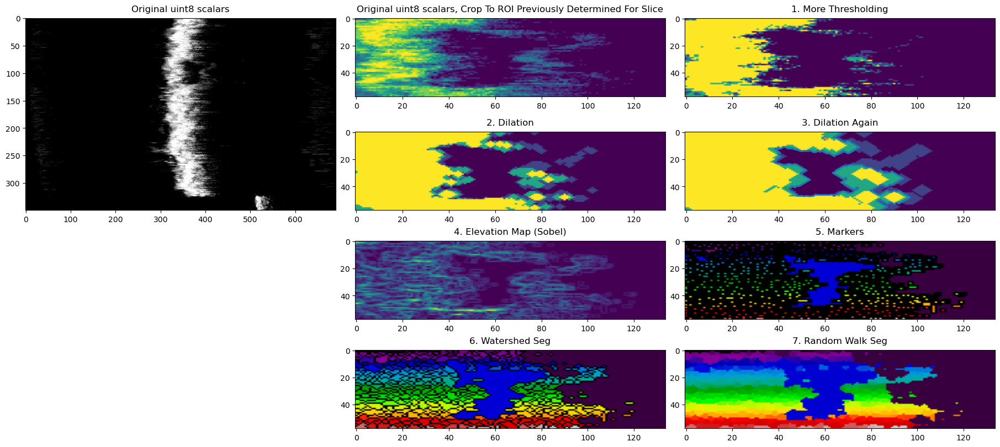

In [70]:
#SliceDataCrossSection = namedtuple('SliceDataCrossSection','pixel_depth_strip_top_sum_threshold pixel_depth_strip_top pixel_depth_strip_bot pixel_depth_wax_center px_wax_transverse_edges wax_top_seed_candidate_px')
import matplotlib.patches
def process_a_crosssection_slice_2(seg : sitk.Image, slab_thickness_px,slice_position_along_strip_px, mkplot=True):
    slab_thickness = slab_thickness_px;
    
    if(slab_thickness>1):
        #seg_subset = seg[:,seg.GetSize()[1]//2-slab_thickness//2:seg.GetSize()[1]//2+slab_thickness//2,:]
        seg_subset = seg[:,slice_position_along_strip_px-slab_thickness//2:slice_position_along_strip_px+slab_thickness//2,:]
        img_subset = simgmerged[:,slice_position_along_strip_px-slab_thickness//2:slice_position_along_strip_px+slab_thickness//2,:]
    else:
        seg_subset = seg[:,slice_position_along_strip_px:slice_position_along_strip_px+1,:]
        img_subset = simgmerged[:,slice_position_along_strip_px:slice_position_along_strip_px+1,:]

    nda = sitk.GetArrayFromImage(seg_subset);
    print(nda.shape)
    nda_mean = np.mean(nda,axis=1);
    nda_mean_sum = np.sum(nda_mean,axis=0);

    orignda = sitk.GetArrayViewFromImage(img_subset);
    orignda_mean = np.mean(nda,axis=1);
    #print(orignda_mean.max)
    # #np.nonzero(nda_mean_sum>5)[0];

    if mkplot:
        #fig,ax = plt.subplots(3,5,figsize=(18,8),constrained_layout=True);
        fig = plt.figure(figsize=(18,8),constrained_layout=True)
        gs = fig.add_gridspec(4,6);

        ax1 = fig.add_subplot(gs[0:2,0:2]);
        ax1.set_title('Original uint8 scalars',y=1.0,verticalalignment='bottom')
        ax1.imshow(orignda_mean,aspect='auto',cmap='gray');

    #print(orignda.shape)
    sliceinfo = dfstepA.loc[slice_position_along_strip_px];
    print(sliceinfo)
    if mkplot:
        ax2 = fig.add_subplot(gs[0,2:4])
        ax2.set_title('Original uint8 scalars, Crop To ROI Previously Determined For Slice',y=1.0,verticalalignment='bottom')
        #ax2.imshow(orignda_mean[:,sliceinfo['pixel_depth_strip_top']:sliceinfo['pixel_depth_strip_bot']])
        slicex = slice(sliceinfo['wax_top_seed_candidate_px'][1]-data_extracted['auto_wax']['max_transverse_wax_edge_width_px']//2 , sliceinfo['wax_top_seed_candidate_px'][1]+data_extracted['auto_wax']['max_transverse_wax_edge_width_px']//2)
        #slicey = slice(sliceinfo['pixel_depth_strip_top'] , sliceinfo['pixel_depth_strip_bot']  )
        slicey = slice(sliceinfo['pixel_depth_strip_top'] , sliceinfo['pixel_depth_strip_top']+2*(sliceinfo['pixel_depth_strip_bot']-sliceinfo['pixel_depth_strip_top'])  )
        ax2.imshow(orignda_mean[  slicex , slicey ],aspect='auto',)


    if mkplot:
        ax3 = fig.add_subplot(gs[0,4:6])
        ax3.set_title('1. More Thresholding',y=1.0,verticalalignment='bottom')
        #dilated = skimage.morphology.dilation(orignda_mean[  slicex , slicey ], footprint=skimage.morphology.disk(6))
        #ax3.imshow(dilated,aspect='auto')
        im3_clipped=np.clip(orignda_mean[  slicex , slicey ],a_min=0.25,a_max=0.5);
        ax3.imshow(im3_clipped,aspect='auto')

    if mkplot:
        ax4 = fig.add_subplot(gs[1,2:4])
        ax4.set_title('2. Dilation',y=1.0,verticalalignment='bottom')
        dilated = skimage.morphology.dilation(im3_clipped, footprint=skimage.morphology.disk(2))
        #dilated = skimage.morphology.dilation(orignda_mean[  slicex , slicey ],footprint=skimage.morphology.disk(2));
        ax4.imshow(dilated,aspect='auto')

    if mkplot:
        ax5 = fig.add_subplot(gs[1,4:6])
        ax5.set_title('3. Dilation Again',y=1.0,verticalalignment='bottom')
        dilated2 = skimage.morphology.dilation(dilated, footprint=skimage.morphology.disk(2))
        ax5.imshow(dilated2,aspect='auto')

    if mkplot:
        # Find contours at a constant value of 0.8
        contours = skimage.measure.find_contours(dilated2, 0.3);
        print(np.min(dilated2),np.max(dilated2))
        for contour in contours:
            ax5.plot(contour[:, 1], contour[:, 0], linewidth=2)

    if mkplot:
        ax6 = fig.add_subplot(gs[2,2:4])
        ax6.set_title('4. Elevation Map (Sobel)',y=1.0,verticalalignment='bottom')
        # Find elevation map
        elevation = skimage.filters.sobel(orignda_mean[  slicex , slicey ]);
        for contour in contours:
            ax6.imshow(elevation,aspect='auto')

    if mkplot:
        ax7 = fig.add_subplot(gs[2,4:6])
        ax7.set_title('5. Markers',y=1.0,verticalalignment='bottom')
        print(orignda_mean[  slicex , slicey ].max(),orignda_mean[  slicex , slicey ].min())
        #markers = orignda_mean[  slicex , slicey ].copy()
        #markers = (markers*255).astype(int);
        # markers = np.zeros(elevation.shape,dtype=np.uint8)
        # markers[orignda_mean[  slicex , slicey ] < 0.01] = 2
        # markers[orignda_mean[  slicex , slicey ] > 0.8] = 1
        markers = skimage.morphology.local_minima(orignda_mean[slicex,slicey])
        markers = skimage.measure.label( skimage.morphology.local_minima(elevation) )

        # cull the markers by size
        # retain top 2
        ret = np.unique_counts(markers)
        sorted_label = np.argsort(ret[1])[::-1][0:2]
        for label in sorted_label:
            bounds_check_1 = any(np.where(markers==label)[0]==markers.shape[0]-1)
            bounds_check_2 = any(np.where(markers==label)[0]==markers.shape[1]-1)
            bounds_check_3 = any(np.where(markers==label)[1]==markers.shape[0]-1)
            bounds_check_4 = any(np.where(markers==label)[1]==markers.shape[1]-1)
            print(label,bounds_check_1,bounds_check_2,bounds_check_3,bounds_check_4)

        # fig, ax = plt.subplots(figsize=(4, 3))
        ax7.imshow(markers, cmap=plt.cm.nipy_spectral,aspect='auto')
    
    if mkplot:
        ax8 = fig.add_subplot(gs[3,2:4])
        ax8.set_title('6. Watershed Seg',y=1.0,verticalalignment='bottom')
        # markers = np.zeros(elevation.shape,dtype=np.uint8);
        # markers[20,60] = 1;
        # markers[20,120] = 2;
        markers = markers.astype(int)
        #markers = skimage.morphology.local_minima(orignda_mean[slicex,slicey])
        seg_watershed = skimage.segmentation.watershed(elevation,markers,watershed_line=True);
        #seg_watershed = skimage.segmentation.watershed(orignda_mean[slicex,slicey],markers,watershed_line=True);
        ax8.imshow(seg_watershed, cmap=plt.cm.nipy_spectral,aspect='auto')
        #ax8.imshow(skimage.morphology.local_minima(orignda_mean[slicex,slicey]) , aspect='auto')
        #ax8.imshow(skimage.morphology.local_minima(elevation) , aspect='auto')

    if mkplot:
        ax9 = fig.add_subplot(gs[3,4:6])
        ax9.set_title('7. Random Walk Seg',y=1.0,verticalalignment='bottom')
        seg_randomwalk = skimage.segmentation.random_walker(orignda_mean[slicex,slicey], markers, beta=10, mode='bf')
        ax9.imshow(seg_randomwalk, cmap=plt.cm.nipy_spectral,aspect='auto')

process_a_crosssection_slice_2(seg_sliced,10,10)

In [ ]:
#SliceDataCrossSection = namedtuple('SliceDataCrossSection','pixel_depth_strip_top_sum_threshold pixel_depth_strip_top pixel_depth_strip_bot pixel_depth_wax_center px_wax_transverse_edges wax_top_seed_candidate_px')
import matplotlib.patches
def process_a_crosssection_slice_2(seg : sitk.Image, slab_thickness_px,slice_position_along_strip_px, mkplot=True):
    slab_thickness = slab_thickness_px;
    
    if(slab_thickness>1):
        #seg_subset = seg[:,seg.GetSize()[1]//2-slab_thickness//2:seg.GetSize()[1]//2+slab_thickness//2,:]
        seg_subset = seg[:,slice_position_along_strip_px-slab_thickness//2:slice_position_along_strip_px+slab_thickness//2,:]
        img_subset = simgmerged[:,slice_position_along_strip_px-slab_thickness//2:slice_position_along_strip_px+slab_thickness//2,:]
    else:
        seg_subset = seg[:,slice_position_along_strip_px:slice_position_along_strip_px+1,:]
        img_subset = simgmerged[:,slice_position_along_strip_px:slice_position_along_strip_px+1,:]

    nda = sitk.GetArrayFromImage(seg_subset);
    print(nda.shape)
    nda_mean = np.mean(nda,axis=1);
    nda_mean_sum = np.sum(nda_mean,axis=0);

    orignda = sitk.GetArrayViewFromImage(img_subset);
    orignda_mean = np.mean(nda,axis=1);

    # slice to region we identified as around the wax valve
    sliceinfo = dfstepA.loc[slice_position_along_strip_px];
    slicex = slice(sliceinfo['wax_top_seed_candidate_px'][1]-data_extracted['auto_wax']['max_transverse_wax_edge_width_px']//2 , sliceinfo['wax_top_seed_candidate_px'][1]+data_extracted['auto_wax']['max_transverse_wax_edge_width_px']//2)
    slicey = slice(sliceinfo['pixel_depth_strip_top'] , sliceinfo['pixel_depth_strip_top']+2*(sliceinfo['pixel_depth_strip_bot']-sliceinfo['pixel_depth_strip_top'])  )

    if mkplot:
        #fig,ax = plt.subplots(3,5,figsize=(18,8),constrained_layout=True);
        fig = plt.figure(figsize=(18,8),constrained_layout=True)
        gs = fig.add_gridspec(4,6);

        ax1 = fig.add_subplot(gs[0:2,0:2]);
        ax1.set_title('Original uint8 scalars',y=1.0,verticalalignment='bottom')
        ax1.imshow(orignda_mean,aspect='auto',cmap='gray');

        #rect = matplotlib.patches.Rectangle( ((slicex.stop-slicex.start)/2+slicex.start, (slicey.stop-slicey.start)/2+slicey.start), slicex.stop-slicex.start, slicey.stop-slicey.start, linewidth=1, edgecolor='r', facecolor='none')
        rect = matplotlib.patches.Rectangle( (slicey.start, slicex.start), slicey.stop-slicey.start, slicex.stop-slicex.start, linewidth=1, edgecolor='r', facecolor='none')
        ax1.add_patch(rect)


    #print(orignda.shape)
    print(sliceinfo)
    if mkplot:
        ax2 = fig.add_subplot(gs[0,2:4])
        ax2.set_title('Original uint8 scalars, Crop To ROI Previously Determined For Slice',y=1.0,verticalalignment='bottom')
        #ax2.imshow(orignda_mean[:,sliceinfo['pixel_depth_strip_top']:sliceinfo['pixel_depth_strip_bot']])
        ax2.imshow(orignda_mean[  slicex , slicey ],aspect='auto',)


    if mkplot:
        ax3 = fig.add_subplot(gs[0,4:6])
        ax3.set_title('1. More Thresholding',y=1.0,verticalalignment='bottom')
        #dilated = skimage.morphology.dilation(orignda_mean[  slicex , slicey ], footprint=skimage.morphology.disk(6))
        #ax3.imshow(dilated,aspect='auto')
        #im3_clipped=np.clip(orignda_mean[  slicex , slicey ],a_min=0.25,a_max=0.5);
        threshold = skimage.filters.threshold_otsu(orignda_mean[  slicex , slicey ],nbins=128);
        print('Thresholding',threshold)
        im3_clipped = orignda_mean[  slicex , slicey ]>threshold/2;
        ax3.imshow(im3_clipped,aspect='auto')

    if mkplot:
        ax4 = fig.add_subplot(gs[1,2:4])
        ax4.set_title('2. Dilation',y=1.0,verticalalignment='bottom')
        dilated = skimage.morphology.dilation(im3_clipped, footprint=skimage.morphology.disk(2))
        #dilated = skimage.morphology.dilation(orignda_mean[  slicex , slicey ],footprint=skimage.morphology.disk(2));
        ax4.imshow(dilated,aspect='auto')

    if mkplot:
        ax5 = fig.add_subplot(gs[1,4:6])
        ax5.set_title('3. Dilation Again',y=1.0,verticalalignment='bottom')
        dilated2 = skimage.morphology.dilation(dilated, footprint=skimage.morphology.disk(2))
        ax5.imshow(dilated2,aspect='auto')

    if mkplot:
        # Find contours at a constant value of 0.8
        contours = skimage.measure.find_contours(dilated2, 0.3);
        print(np.min(dilated2),np.max(dilated2))
        for contour in contours:
            ax5.plot(contour[:, 1], contour[:, 0], linewidth=2)

    if mkplot:
        ax6 = fig.add_subplot(gs[2,2:4])
        ax6.set_title('4. Elevation Map (Sobel)',y=1.0,verticalalignment='bottom')
        # Find elevation map
        elevation = skimage.filters.sobel(orignda_mean[  slicex , slicey ]);
        for contour in contours:
            ax6.imshow(elevation,aspect='auto')

    if mkplot:
        ax7 = fig.add_subplot(gs[2,4:6])
        ax7.set_title('5. Markers',y=1.0,verticalalignment='bottom')
        print(orignda_mean[  slicex , slicey ].max(),orignda_mean[  slicex , slicey ].min())
        #markers = orignda_mean[  slicex , slicey ].copy()
        #markers = (markers*255).astype(int);
        # markers = np.zeros(elevation.shape,dtype=np.uint8)
        # markers[orignda_mean[  slicex , slicey ] < 0.01] = 2
        # markers[orignda_mean[  slicex , slicey ] > 0.8] = 1
        #markers = skimage.morphology.local_minima(orignda_mean[slicex,slicey])
        markers = skimage.measure.label( skimage.morphology.local_minima(elevation) )
        #markers = skimage.measure.label( skimage.morphology.local_minima( orignda_mean[slicex,slicey] ) )

        # cull the markers by size
        # retain top 2
        ret = np.unique_counts(markers)
        sorted_label = np.argsort(ret[1])[::-1][0:5]
        for label in sorted_label:
            bounds_check_1 = any(np.where(markers==label)[0]==markers.shape[0]-1)
            bounds_check_2 = any(np.where(markers==label)[0]==markers.shape[1]-1)
            bounds_check_3 = any(np.where(markers==label)[1]==markers.shape[0]-1)
            bounds_check_4 = any(np.where(markers==label)[1]==markers.shape[1]-1)
            print(label,bounds_check_1,bounds_check_2,bounds_check_3,bounds_check_4)

        #markers[markers>5] = 100

        # fig, ax = plt.subplots(figsize=(4, 3))
        ax7.imshow(markers, cmap=plt.cm.nipy_spectral,aspect='auto')
        # markers2 = markers.copy();
        # markers2[markers2!=87] = 0;
        # ax7.imshow(markers2, cmap=plt.cm.nipy_spectral,aspect='auto')
    
    if mkplot:
        ax8 = fig.add_subplot(gs[3,2:4])
        ax8.set_title('6. Watershed Seg',y=1.0,verticalalignment='bottom')
        # markers = np.zeros(elevation.shape,dtype=np.uint8);
        # markers[20,60] = 1;
        # markers[20,120] = 2;
        markers = markers.astype(int)
        #markers = skimage.morphology.local_minima(orignda_mean[slicex,slicey])
        seg_watershed = skimage.segmentation.watershed(elevation,markers,watershed_line=True);
        #seg_watershed = skimage.segmentation.watershed(orignda_mean[slicex,slicey],markers,watershed_line=True);
        ax8.imshow(seg_watershed, cmap=plt.cm.nipy_spectral,aspect='auto')
        #ax8.imshow(skimage.morphology.local_minima(orignda_mean[slicex,slicey]) , aspect='auto')
        #ax8.imshow(skimage.morphology.local_minima(elevation) , aspect='auto')

    if mkplot:
        ax9 = fig.add_subplot(gs[3,4:6])
        ax9.set_title('7. Random Walk Seg',y=1.0,verticalalignment='bottom')
        markers = markers.astype(int);
        #markers[markers!=87] = -1;
        #seg_randomwalk = skimage.segmentation.random_walker(orignda_mean[slicex,slicey], markers, beta=15, mode='bf')
        seg_randomwalk = skimage.segmentation.random_walker(elevation, markers, beta=10, mode='bf')
        ax9.imshow(seg_randomwalk, cmap=plt.cm.nipy_spectral,aspect='auto')

    #seg_selected = seg_randomwalk.copy();
    seg_selected = seg_watershed.copy();
    seg_selected[seg_selected!=87] = 0;

    if mkplot:
        ax10 = fig.add_subplot(gs[2:4,0:2]);
        ax10.set_title('Final Segmentation',y=1.0,verticalalignment='bottom')
        # ax10.imshow(orignda_mean,aspect='auto',cmap='gray');
        # xlim=ax10.get_xlim()
        # ylim=ax10.get_ylim()
        # #ax10.imshow(np.ma.masked_array(seg_selected,seg_selected==0),cmap=plt.cm.jet,aspect='auto')
        # #ax10.imshow(np.ma.masked_array(seg_selected,seg_selected==0),cmap=plt.cm.jet,aspect='auto',extent=(slicey.start,slicey.stop,slicex.start,slicex.stop))
        # #ax10.imshow( seg_selected ,cmap=plt.cm.jet,aspect='auto',extent=(slicey.start,slicey.stop,slicex.stop,slicex.start))
        # ax10.imshow( np.ma.masked_array(seg_selected,seg_selected==0) ,cmap=plt.cm.jet,aspect='auto',extent=(slicey.start,slicey.stop,slicex.stop,slicex.start))
        # ax10.set_xlim(xlim);
        # ax10.set_ylim(ylim);

        ax10.imshow(orignda_mean[  slicex , slicey ],cmap='gray',aspect='auto',)
        ax10.imshow( np.ma.masked_array(seg_selected,seg_selected==0) ,cmap=plt.cm.jet,aspect='auto')



process_a_crosssection_slice_2(seg_sliced,10,10)

(350, 10, 690)
pixel_depth_strip_top_sum_threshold                                       100
pixel_depth_strip_top                                                     209
pixel_depth_strip_bot                                                     273
pixel_depth_wax_center                                                    242
px_wax_transverse_edges                (81.8010752688172, 122.12790697674419)
wax_top_seed_candidate_px                                          (218, 101)
Name: 2370, dtype: object
slicex slice(72, 130, None)
slicey slice(np.int64(209), np.int64(401), None)
4 Multiotsu Thresholds [ 26 102 178]
10 True False True True
0 True False True False
51 True False False False
47 False False False False
37 False False False False


({'wax_image_sum_along_strip_depth': array([ 6531,  7247,  7807,  8701,  9691, 10303, 11018, 11122, 11507,
         11046, 11044, 10615, 10358,  9489,  8495,  7652,  7014,  6172,
          5818,  5309,  4926,  4774,  4543,  4440,  4316,  4058,  3882,
          3803,  3928,  3956,  3749,  3827,  3777,  3825,  3750,  3547,
          3701,  3726,  3469,  3317,  3675,  3977,  4209,  4209,  4844,
          4766,  5257,  5205,  5408,  5384,  5486,  5689,  5819,  5487,
          5101,  4617,  4718,  4310,  4235,  4158,  3824,  3368,  2908,
          2625,  2042,  2317,  2143,  2043,  1637,  1277,  1457,  1303,
           846,   767,   616,   311,   310,   333,   309,    26,    26,
             0,     0,    26,    26,     0,     0,     0,     0,     0,
            26,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,

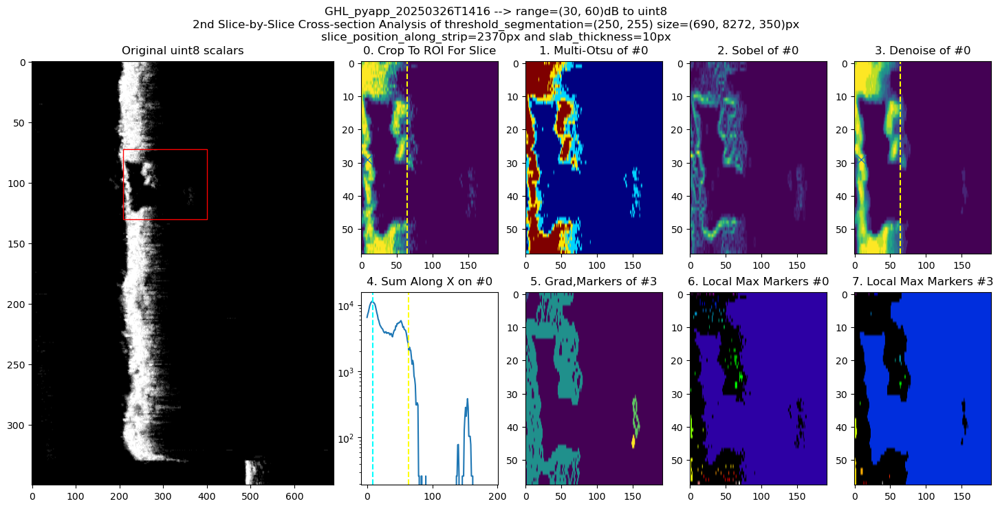

In [94]:
#SliceDataCrossSection = namedtuple('SliceDataCrossSection','pixel_depth_strip_top_sum_threshold pixel_depth_strip_top pixel_depth_strip_bot pixel_depth_wax_center px_wax_transverse_edges wax_top_seed_candidate_px')
import matplotlib.patches
def process_a_crosssection_slice_2(seg : sitk.Image, slab_thickness_px,slice_position_along_strip_px, mkplot=True):
    slab_thickness = slab_thickness_px;
    
    if(slab_thickness>1):
        #seg_subset = seg[:,seg.GetSize()[1]//2-slab_thickness//2:seg.GetSize()[1]//2+slab_thickness//2,:]
        seg_subset = seg[:,slice_position_along_strip_px-slab_thickness//2:slice_position_along_strip_px+slab_thickness//2,:]
        img_subset = simgmerged[:,slice_position_along_strip_px-slab_thickness//2:slice_position_along_strip_px+slab_thickness//2,:]
    else:
        seg_subset = seg[:,slice_position_along_strip_px:slice_position_along_strip_px+1,:]
        img_subset = simgmerged[:,slice_position_along_strip_px:slice_position_along_strip_px+1,:]

    nda = sitk.GetArrayFromImage(seg_subset);
    print(nda.shape)
    nda_mean = np.mean(nda,axis=1);
    nda_mean_sum = np.sum(nda_mean,axis=0);

    orignda = sitk.GetArrayViewFromImage(img_subset);
    orignda_mean = np.mean(nda,axis=1);

    # slice to region we identified as around the wax valve
    sliceinfo = dfstepA.loc[slice_position_along_strip_px];
    print(sliceinfo)
    slicex = slice(sliceinfo['wax_top_seed_candidate_px'][1]-data_extracted['auto_wax']['max_transverse_wax_edge_width_px']//2 , sliceinfo['wax_top_seed_candidate_px'][1]+data_extracted['auto_wax']['max_transverse_wax_edge_width_px']//2)
    slicey = slice(sliceinfo['pixel_depth_strip_top'] , sliceinfo['pixel_depth_strip_top']+3*(sliceinfo['pixel_depth_strip_bot']-sliceinfo['pixel_depth_strip_top'])  )
    #slicey = slice(sliceinfo['wax_top_seed_candidate_px'][0] , sliceinfo['pixel_depth_strip_top']+3*(sliceinfo['pixel_depth_strip_bot']-sliceinfo['wax_top_seed_candidate_px'][0])  )
    print('slicex',slicex);
    print('slicey',slicey);
    image = orignda_mean[  slicex , slicey ];
    image = skimage.util.img_as_ubyte(image);

    if mkplot:
        #fig,ax = plt.subplots(3,5,figsize=(18,8),constrained_layout=True);
        fig = plt.figure(figsize=(18,8),constrained_layout=False)
        gs = fig.add_gridspec(2,6);

        fig.suptitle(
            """{:s} --> range={:s}dB to uint8
2nd Slice-by-Slice Cross-section Analysis of threshold_segmentation={:s} size={:s}px
slice_position_along_strip={:.0f}px and slab_thickness={:.0f}px
""".format(octstudy.name,str((oct_scalar_min,oct_scalar_max)),str((250,255)),str(seg.GetSize()),slice_position_along_strip_px,slab_thickness_px))
        
        ax1 = fig.add_subplot(gs[0:2,0:2]);
        ax1.set_title('Original uint8 scalars',y=1.0,verticalalignment='bottom')
        ax1.imshow(orignda_mean,aspect='auto',cmap='gray');

        #rect = matplotlib.patches.Rectangle( ((slicex.stop-slicex.start)/2+slicex.start, (slicey.stop-slicey.start)/2+slicey.start), slicex.stop-slicex.start, slicey.stop-slicey.start, linewidth=1, edgecolor='r', facecolor='none')
        rect = matplotlib.patches.Rectangle( (slicey.start, slicex.start), slicey.stop-slicey.start, slicex.stop-slicex.start, linewidth=1, edgecolor='r', facecolor='none')
        ax1.add_patch(rect)


    #print(orignda.shape)
    if mkplot:
        ax2 = fig.add_subplot(gs[0,2])
        ax2.set_title('0. Crop To ROI For Slice',y=1.0,verticalalignment='bottom')
        #ax2.imshow(orignda_mean[:,sliceinfo['pixel_depth_strip_top']:sliceinfo['pixel_depth_strip_bot']])
        ax2.imshow(image,aspect='auto',)
        ax2.axvline(sliceinfo['pixel_depth_strip_bot']-sliceinfo['pixel_depth_strip_top'],color='yellow',linestyle='dashed')
        ax2.plot(sliceinfo['wax_top_seed_candidate_px'][0]-slicey.start,sliceinfo['wax_top_seed_candidate_px'][1]-slicex.start,marker='x',markersize=10)


    ## -- fig3
    if mkplot:
        ax3 = fig.add_subplot(gs[0,3])
        ax3.set_title('1. Multi-Otsu of #0',y=1.0,verticalalignment='bottom')

    # Applying multi-Otsu threshold for the default value, generating
    # three classes.
    thresholds = skimage.filters.threshold_multiotsu(image,classes=4)
    print('4 Multiotsu Thresholds',thresholds);

    # Using the threshold values, we generate the three regions.
    regions = np.digitize(image, bins=thresholds)
    if mkplot:
        ax3.imshow(regions,cmap='jet',aspect='auto')

    ## -- fig4
    edges = skimage.filters.sobel(image);
    if mkplot:
        ax4 = fig.add_subplot(gs[0,4])
        ax4.set_title('2. Sobel of #0',y=1.0,verticalalignment='bottom')
        ax4.imshow(edges,aspect='auto')


    ## -- fig5
    if mkplot:
        ax5 = fig.add_subplot(gs[0,5])
        ax5.set_title('3. Denoise of #0',y=1.0,verticalalignment='bottom')


    # denoise image
    denoised = skimage.filters.rank.median(image, skimage.morphology.disk(2))

    if mkplot:
        ax5.imshow(denoised,aspect='auto')
        ax5.axvline(sliceinfo['pixel_depth_strip_bot']-slicey.start,color='yellow',linestyle='dashed')
        ax5.plot(sliceinfo['wax_top_seed_candidate_px'][0]-slicey.start,sliceinfo['wax_top_seed_candidate_px'][1]-slicex.start,marker='x',markersize=10)

    ## -- fig6
    image_sumx = np.sum(image,axis=0);
    if mkplot:
        ax6 = fig.add_subplot(gs[1,2])
        ax6.set_title('4. Sum Along X on #0',y=1.0,verticalalignment='bottom')
        ax6.semilogy(image_sumx)
        ax6.axvline(sliceinfo['pixel_depth_strip_bot']-slicey.start,color='yellow',linestyle='dashed')
        ax6.axvline(sliceinfo['wax_top_seed_candidate_px'][0]-slicey.start,color='cyan',linestyle='dashed')

    ## -- fig7
    if mkplot:
        ax7 = fig.add_subplot(gs[1,3]);
        ax7.set_title('5. Grad,Markers of #3',y=1.0,verticalalignment='bottom')
    # find continuous region (low gradient -
    # where less than 10 for this image) --> markers
    # disk(5) is used here to get a more smooth image
    markers = skimage.filters.rank.gradient(denoised, skimage.morphology.disk(1))
    #ret = scipy.ndimage.label(markers)
    #print(ret)
    markers = scipy.ndimage.label(markers)[0]
    # ws = skimage.segmentation.watershed(edges, markers)
    # seg1 = skimage.measure.label(ws == foreground)

    if mkplot:
        ax7.imshow(markers,aspect='auto')

    ## -- fig8
    if mkplot:
        ax8 = fig.add_subplot(gs[1,4])
        ax8.set_title('6. Local Max Markers #0',y=1.0,verticalalignment='bottom')
    markers = skimage.measure.label( skimage.morphology.local_minima(image) )
    #markers = skimage.measure.label( skimage.morphology.local_minima( orignda_mean[slicex,slicey] ) )

    # cull the markers by size
    # retain top 2
    ret = np.unique_counts(markers)
    sorted_label = np.argsort(ret[1])[::-1][0:5]
    for label in sorted_label:
        bounds_check_1 = any(np.where(markers==label)[0]==markers.shape[0]-1)
        bounds_check_2 = any(np.where(markers==label)[0]==markers.shape[1]-1)
        bounds_check_3 = any(np.where(markers==label)[1]==markers.shape[0]-1)
        bounds_check_4 = any(np.where(markers==label)[1]==markers.shape[1]-1)
        print(label,bounds_check_1,bounds_check_2,bounds_check_3,bounds_check_4)
    if mkplot:
        # fig, ax = plt.subplots(figsize=(4, 3))
        ax8.imshow(markers, cmap=plt.cm.nipy_spectral,aspect='auto')

    ## -- fig9
    markers = skimage.measure.label( skimage.morphology.local_minima(denoised) )
    if mkplot:
        ax9 = fig.add_subplot(gs[1,5])
        ax9.set_title('7. Local Max Markers #3',y=1.0,verticalalignment='bottom')
        ax9.imshow(markers, cmap=plt.cm.nipy_spectral,aspect='auto')


    localdata = {
        'wax_image_sum_along_strip_depth':image_sumx
    }

    return localdata,fig;

process_a_crosssection_slice_2(seg_sliced,10,2370)
#process_a_crosssection_slice_2(seg_sliced,10,2875)

In [95]:
# loop and calculate and make figures
slab_thickness = 10;
seg.GetSize()[1]
datalist2 = [];
#np.linspace(start=slab_thickness//2,stop=Seg.GetSize()[1],num)
slice_centers = list(range(slab_thickness//2, seg_sliced.GetSize()[1], slab_thickness//2))
for count,slicecenter in enumerate(slice_centers):
    print(count,slicecenter)
    output_filename = r'C:\TEMP\figureoutput2_{:04d}.jpg'.format(count);
    data,fig = process_a_crosssection_slice_2(seg_sliced,slab_thickness,slicecenter,mkplot=True);
    fig.savefig(output_filename);
    print('Wrote',output_filename);
    plt.close(fig);
    
    datalist2.append(data);

0 5
(350, 10, 690)
pixel_depth_strip_top_sum_threshold                               100
pixel_depth_strip_top                                             319
pixel_depth_strip_bot                                             381
pixel_depth_wax_center                                            354
px_wax_transverse_edges                (113.2625, 130.43150684931507)
wax_top_seed_candidate_px                                  (330, 121)
Name: 5, dtype: object
slicex slice(92, 150, None)
slicey slice(np.int64(319), np.int64(505), None)
4 Multiotsu Thresholds [ 26  76 153]
9 True False True False
0 True False True True
11 False False False True
75 False False False True
128 True False False True
Wrote C:\TEMP\figureoutput2_0000.jpg
1 10
(350, 10, 690)
pixel_depth_strip_top_sum_threshold                                        100
pixel_depth_strip_top                                                      317
pixel_depth_strip_bot                                                      384
pixel

In [96]:
# make video from image sequence
import ffmpeg
import glob
import os
try:
    (
    ffmpeg
    .input(r'C:\TEMP\figureoutput2_%04d.jpg', framerate=30) # Assumes images are named frame_1.png, frame_2.png etc.
    .output(r'C:\TEMP\figureoutput2.mp4', crf=20, preset='slower', movflags='faststart', pix_fmt='yuv420p')
    .run(capture_stdout=True, capture_stderr=True, overwrite_output=True)
    )
except ffmpeg.Error as e:
    print('stdout:', e.stdout.decode('utf8'))
    print('stderr:', e.stderr.decode('utf8'))
    raise e
# delete the source .jpgs
for filepath in glob.glob(r'C:\TEMP\figureoutput*.jpg'):
    os.unlink(filepath);


In [ ]:
# extract items from datalist2
datalist2[10]['wax_image_sum_along_strip_depth'].shape
max_shape = max( [x['wax_image_sum_along_strip_depth'].shape[0] for x in datalist2] )
print('Max Datalist2 Shape Was:',max_shape)

# insert items left-justified into the big array
sum_wax_strip_along_length = np.zeros((len(datalist2),max_shape))
for count,x in enumerate(datalist2):
    sum_wax_strip_along_length[count,0:len(x['wax_image_sum_along_strip_depth'])] = x['wax_image_sum_along_strip_depth']

fig = plt.figure(figsize=(22,6),constrained_layout=True)
gs = fig.add_gridspec(4,2);

# fig.suptitle(
#     """{:s} --> range={:s}dB to uint8
# 2nd Slice-by-Slice Cross-section Analysis of threshold_segmentation={:s} size={:s}px
# slice_position_along_strip={:.0f}px and slab_thickness={:.0f}px
# """.format(octstudy.name,str((oct_scalar_min,oct_scalar_max)),str((250,255)),str(seg.GetSize()),slice_position_along_strip_px,slab_thickness_px))


ax1 = fig.add_subplot(gs[0,0:2]);
ax1.set_title('Datalist 2',y=1.0,verticalalignment='bottom')
#parray = np.vstack(dfstepA['px_wax_transverse_edges'].apply(np.array))
parray = np.vstack(dfstepA['wax_top_seed_candidate_px'].apply(np.array))
parray = np.insert(parray,1,dfstepA.index.values,axis=1);
ax1.plot(parray[:,1],parray[:,0],marker='.')
ax1.set_xlabel('Position Along Strip (px)')
ax1.set_ylabel('Strip Depth (px)')


ax1 = fig.add_subplot(gs[1,0:2]);
ax1.set_title('Datalist 2',y=1.0,verticalalignment='bottom')
ax1.imshow((sum_wax_strip_along_length[:,0:]).T,cmap='jet',aspect='auto')
ax1.set_xlabel('Position Along Strip (px)')
ax1.set_ylabel('Strip Depth (px)')

In [97]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# extract items from datalist2
datalist2[10]['wax_image_sum_along_strip_depth'].shape
max_shape = max( [x['wax_image_sum_along_strip_depth'].shape[0] for x in datalist2] )
print('Max Datalist2 Shape Was:',max_shape)

# insert items left-justified into the big array
sum_wax_strip_along_length = np.zeros((len(datalist2),max_shape))
sum_wax_strip_along_length2 = np.zeros((len(datalist2),max_shape))
sum_wax_strip_along_length3 = np.zeros((len(datalist2),max_shape))

for count,x in enumerate(datalist2):
    #1
    sum_wax_strip_along_length[count,0:len(x['wax_image_sum_along_strip_depth'])] = x['wax_image_sum_along_strip_depth']

    #2
    sliceinfo = dfstepA.iloc[count];
    #print(sliceinfo['pixel_depth_strip_top'].item() , sliceinfo['wax_top_seed_candidate_px'][1])
    if( sliceinfo['pixel_depth_strip_top'].item() > sliceinfo['wax_top_seed_candidate_px'][0]):
        print('starting at 0',sliceinfo['pixel_depth_strip_top'].item(),sliceinfo['wax_top_seed_candidate_px'][0])
        slicer_for_intensity = slice(0, x['wax_image_sum_along_strip_depth'].shape[0]);
    else:
        slicer_for_intensity = slice(sliceinfo['wax_top_seed_candidate_px'][0]-sliceinfo['pixel_depth_strip_top'].item(), x['wax_image_sum_along_strip_depth'].shape[0]);
    #slicer_for_intensity = slice(0, x['wax_image_sum_along_strip_depth'].shape[0]);

    print(slicer_for_intensity)
    #sum_wax_strip_along_length[count,0:len(x['wax_image_sum_along_strip_depth'])] = x['wax_image_sum_along_strip_depth'];
    #print('Destination end slice:',slicer_for_intensity.stop-slicer_for_intensity.start)
    sum_wax_strip_along_length2[ count , 0:(slicer_for_intensity.stop-slicer_for_intensity.start) ] = x['wax_image_sum_along_strip_depth'][slicer_for_intensity];


    # 3
    pks = scipy.signal.find_peaks(x['wax_image_sum_along_strip_depth'],prominence=200)
    print('Peaks',pks)
    widths = scipy.signal.peak_widths(x['wax_image_sum_along_strip_depth'],pks[0],rel_height=0.5)
    print('Widths',widths)
    if(len(widths[0])==0):
        #plt.plot(x['wax_image_sum_along_strip_depth'])
        start_idx = np.argmax(x['wax_image_sum_along_strip_depth']);
    else:
        #pkidxlargest = np.argmax(widths[1]);
        pkidxlargest = 0;
        print('Tallest peak',pkidxlargest)
        try:
            start_idx = pks[0][pkidxlargest]
        except Exception as e:
            plt.plot(x['wax_image_sum_along_strip_depth'])
            raise(e)
            break;
    slicer_for_intensity = slice(start_idx, x['wax_image_sum_along_strip_depth'].shape[0]);
    print(slicer_for_intensity)
    # plt.figure();
    sum_wax_strip_along_length3[ count , 0:(slicer_for_intensity.stop-slicer_for_intensity.start) ] = x['wax_image_sum_along_strip_depth'][slicer_for_intensity];
    
    # plt.plot(pks[0],x['wax_image_sum_along_strip_depth'][pks[0]],marker='o',color='red',linestyle='')
    # break;


Max Datalist2 Shape Was: 225
slice(11, 186, None)
Peaks (array([ 12,  19,  38,  61,  67, 168]), {'prominences': array([3365.,  229.,  203.,  278.,  205., 3238.]), 'left_bases': array([  0,  18,  37,  59,  66, 153]), 'right_bases': array([100, 100, 100, 100, 100, 185])})
Widths (array([20.75666355,  0.84592145,  1.54537367,  3.16338046,  1.78285714,
        8.89691877]), array([8390.5, 9934.5, 5685.5, 2027. , 1836.5, 2135. ]), array([  3.53055556,  18.5       ,  37.5       ,  59.54296875,
        66.5       , 162.6745098 ]), array([ 24.2872191 ,  19.34592145,  39.04537367,  62.70634921,
        68.28285714, 171.57142857]))
Tallest peak 0
slice(np.int64(12), 186, None)
slice(15, 201, None)
Peaks (array([10, 25, 77]), {'prominences': array([3654.,  282.,  947.]), 'left_bases': array([ 0, 24, 66]), 'right_bases': array([114, 114, 114])})
Widths (array([20.51943235,  0.89275766, 10.50757567]), array([10465. , 10524. ,  1799.5]), array([ 2.94109397, 24.5       , 70.26419214]), array([23.4605

In [118]:
pp.pprint(data_extracted)

{   'auto_bounds': {   'topdown_edge_left_px': 226,
                       'topdown_edge_left_px2': 229,
                       'topdown_edge_right_px': 8500,
                       'topdown_edge_right_px2': 8501},
    'auto_topdown_houghline': (   array([6252, 5150, 4801], dtype=uint64),
                                  array([1.57298346, 1.5721086 , 1.5721086 ]),
                                  array([325., 125.,  76.])),
    'auto_wax': {'max_transverse_wax_edge_width_px': 58}}


In [131]:
# Save Extracted Information To File
# import yaml
# with open(octstudy.folder_study_processed/'data_extracted.yaml', 'w') as file:
#     yaml.dump(data_extracted.to_dict(),file)
np.savez(octstudy.folder_study_processed/'data_extracted.npz',data_extracted.to_dict())

In [132]:
# Test Load Extracted Information From File
loaded_data_extracted = addict.Addict( np.load(octstudy.folder_study_processed/'data_extracted.npz',allow_pickle=True)['arr_0'].item() )

In [133]:
loaded_data_extracted

{'auto_bounds': {'topdown_edge_left_px': 226,
  'topdown_edge_right_px': 8500,
  'topdown_edge_left_px2': 229,
  'topdown_edge_right_px2': 8501},
 'auto_topdown_houghline': (array([6252, 5150, 4801], dtype=uint64),
  array([1.57298346, 1.5721086 , 1.5721086 ]),
  array([325., 125.,  76.])),
 'auto_wax': {'max_transverse_wax_edge_width_px': 58}}

In [134]:

# fig = plt.figure(figsize=(22,6),constrained_layout=True)
# gs = fig.add_gridspec(4,2);

# # fig.suptitle(
# #     """{:s} --> range={:s}dB to uint8
# # 2nd Slice-by-Slice Cross-section Analysis of threshold_segmentation={:s} size={:s}px
# # slice_position_along_strip={:.0f}px and slab_thickness={:.0f}px
# # """.format(octstudy.name,str((oct_scalar_min,oct_scalar_max)),str((250,255)),str(seg.GetSize()),slice_position_along_strip_px,slab_thickness_px))


# ax1 = fig.add_subplot(gs[0,0:2]);
# ax1.set_title('Datalist 2',y=1.0,verticalalignment='bottom')
# #parray = np.vstack(dfstepA['px_wax_transverse_edges'].apply(np.array))
# parray = np.vstack(dfstepA['wax_top_seed_candidate_px'].apply(np.array))
# parray = np.insert(parray,1,dfstepA.index.values,axis=1);
# ax1.plot(parray[:,1],parray[:,0],marker='.')
# ax1.set_xlabel('Position Along Strip (px)')
# ax1.set_ylabel('Strip Depth (px)')


# ax1 = fig.add_subplot(gs[1,0:2]);
# ax1.set_title('Datalist 2',y=1.0,verticalalignment='bottom')
# ax1.imshow((sum_wax_strip_along_length[:,0:]).T,cmap='jet',aspect='auto')
# ax1.set_xlabel('Position Along Strip (px)')
# ax1.set_ylabel('Strip Depth (px)')

import plotly.graph_objects as go
fig = make_subplots(rows=3,shared_xaxes=True)

fig.add_trace(
    go.Heatmap(
        x = dfstepA.index.values,
        z = sum_wax_strip_along_length[:,0:].T,
        type = 'heatmap',
        colorscale = 'jet'
    ),
    row=1,col=1,
)

fig.add_trace(
    go.Heatmap(
        x = dfstepA.index.values,
        z = sum_wax_strip_along_length2[:,0:].T,
        type = 'heatmap',
        colorscale = 'jet'
    ),
    row=2,col=1,
)

fig.add_trace(
    go.Heatmap(
        x = dfstepA.index.values,
        z = sum_wax_strip_along_length3[:,0:].T,
        type = 'heatmap',
        colorscale = 'jet'
    ),
    row=3,col=1,
)

fig.update_xaxes(title='distance along strip (px)',row=3,col=1);
fig.update_yaxes(title='depth into strip (px)',autorange='reversed',col=1);
#fig = px.imshow(sum_wax_strip_along_length[:,0:]);

#fig.show(renderer='browser')
fig



In [135]:
fig.layout.autosize = True
pn_plotly = pn.pane.Plotly(fig);
pn_log = pn.pane.Str("");
pn_mpl2 = pn.pane.Matplotlib(dpi=80);

@pn.depends(pn_plotly.param.click_data, watch=True)
def on_click(event):
    print(str(event));
    pn_log.object+="{:s}<br>".format(str(event));

    xclicked = event['points'][0]['x'];
    dat,mplfig = process_a_crosssection_slice_2(seg_sliced,10,xclicked);
    pn_mpl2.object = mplfig;

pnfin = pn.Tabs(('Overview',pn_plotly),('Matpotlib2',pn_mpl2),('Log',pn_log));

#server = pn.serve(pnfin)
pn_plotly

BokehModel(combine_events=True, render_bundle={'docs_json': {'4c34c63a-1769-4904-938f-7a8f95f6a30c': {'version…

In [ ]:
del pn_plotly, pnfin

In [ ]:
parray

# Processing Step 1 - Use top-down view to draw the centerline of the wax valve

In [ ]:
print(vdvol)

In [ ]:
pl = vedo_plotters.SimonSlicer3DPlotter(
    vdvol,
    #cmaps=("gist_ncar_r", "jet", "Spectral_r", "hot_r", "bone_r"),
    cmaps=("grey","gist_ncar_r"),
    use_slider3d=False,
    show_histo=False,
    show_icon=False,
    bg="black",
    bg2="gray5",
    slice_X=True,
    slice_Y=False,
    slice_Z=False,
    scalar_range=(30.0,50.0), # dB range from OCT scalars
)

bnds = vdvol.bounds();

#vdLine = vedo.Line(p0=(0,0,bnds[5]/2),p1=(0,bnds[3],bnds[5]/2),closed=False,lw=6,c='red');
try:
    step1info
    # variable is defined
    pts = [step1info['wax_valve_manual_nodes_mm'][0], step1info['wax_valve_manual_nodes_mm'][1]];
except NameError:
    # variable was not defined
    pts = [(0, 0, bnds[5]/2) , (0, bnds[3], bnds[5]/2)];
#pl.add(vdLine);
# Add the spline tool using the same points and interact with it
sptool = pl.add_spline_tool(pts, pc='red', lw=3, closed=False);

# # Add a callback to print some info as the lines is changed
# sptool.add_observer(
#     "end of interaction", 
#     lambda o, e: (
#         print(f"Points changed! Pts= {sptool.nodes()}"),
#     )
# )

pl.parallel_projection(True); # orthographic

# # Can now add any other vedo object to the Plotter scene:
pl += vedo.Text2D(
"""STEP 1 - Find wax stripe

Instructions:

#1. select a slice pixel position using the red slider, if the wax valve region is not visible

#2. drag handles of the line to align with ends of wax valve, and centered along the wax valve

#3. when done press ESC
"""
)

pl.show(
    viewup=[0,0,-1],
    interactive=True,axes=4
);
pl.close()

step1info = dict(
    longitudinal_depth_slicer_voxels=pl.xslider.value,
    wax_valve_manual_nodes_mm=sptool.nodes(),
    longitudinal_depth_slicer_bounds_mm=pl.xslice.bounds(),
)

In [ ]:
print('Step 1 Info:')
pp.pprint(step1info);

# Step 2 - Find Other Dimension

In [ ]:
import math
# origin
slice_origin=(
    step1info['longitudinal_depth_slicer_bounds_mm'][0] ,
    (step1info['wax_valve_manual_nodes_mm'][1][1]-step1info['wax_valve_manual_nodes_mm'][0][1])/2 + step1info['wax_valve_manual_nodes_mm'][0][1] ,
    (step1info['wax_valve_manual_nodes_mm'][1][2]-step1info['wax_valve_manual_nodes_mm'][0][2])/2 + step1info['wax_valve_manual_nodes_mm'][0][2] ,
)
slice_origin = tuple([x.item() for x in slice_origin])
slice_origin

In [ ]:
#v1 = []
v1 = np.diff( np.array( step1info['wax_valve_manual_nodes_mm'] ) ,axis=0)[0];
v2 = np.array([0,1,0]);
v1_u = v1/np.linalg.norm(v1);
v2_u = v2/np.linalg.norm(v2);
print(v1_u)
print(v2_u)
#np.linalg.norm(np.array(step1info['wax_valve_manual_nodes_mm']),axis=1).T
angle_to_y_radians = math.acos(np.dot(v1_u,v2_u))
print('Degrees:',math.degrees(angle_to_y_radians))


def rotate_vector(v, axis, theta):
    """
    Rotates a vector v around an axis by an angle theta.

    Parameters:
    v (numpy.ndarray): The vector to rotate.
    axis (numpy.ndarray): The axis to rotate around.
    theta (float): The angle of rotation in radians.

    Returns:
    numpy.ndarray: The rotated vector.
    """
    axis = axis / np.linalg.norm(axis)  # Normalize the axis
    a = np.cos(theta / 2.0)
    b, c, d = -axis * np.sin(theta / 2.0)
    aa, bb, cc, dd = a * a, b * b, c * c, d * d
    bc, ad, ac, ab, bd, cd = b * c, a * d, a * c, a * b, b * d, c * d
    rotation_matrix = np.array([[aa + bb - cc - dd, 2 * (bc + ad), 2 * (bd - ac)],
                                [2 * (bc - ad), aa + cc - bb - dd, 2 * (cd + ab)],
                                [2 * (bd + ac), 2 * (cd - ab), aa + dd - bb - cc]])
    return np.dot(rotation_matrix, v)

slice_normal = rotate_vector( np.array([0,0,1]) , axis=np.array([1,0,0]), theta=angle_to_y_radians)
print('Normal Vector',slice_normal)

In [ ]:
#slice = vol.copy();
#slice_origin=( step1info['longitudinal_depth_slicer_bounds_mm'][0] , (step1info['wax_valve_manual_nodes_mm'][1][1]-step1info['wax_valve_manual_nodes_mm'][0][1])/2 , (step1info['wax_valve_manual_nodes_mm'][1][2]-step1info['wax_valve_manual_nodes_mm'][0][2])/2 )
vdPlane = vedo.Plane(pos=slice_origin,normal=slice_normal,s=(v1[1],6),c='red7',alpha=0.75)

pl = vedo_plotters.SimonSlicer3DPlotter(
    vdvol,
    #cmaps=("gist_ncar_r", "jet", "Spectral_r", "hot_r", "bone_r"),
    cmaps=("grey","gist_ncar_r"),
    use_slider3d=False,
    show_histo=False,
    show_icon=False,
    bg="black",
    bg2="gray5",
    slice_X=True,
    slice_Y=False,
    slice_Z=False,
    scalar_range=(30.0,50.0), # dB range from OCT scalars
)
#pl = vedo.Plotter();

#pl.add(vdPlane);
vdSlice = vdvol.slice_plane(origin=slice_origin,normal=slice_normal,autocrop=True).cmap('jet',vmin=38.0,vmax=60.0);
pl.add(vdSlice);

# # Can now add any other vedo object to the Plotter scene:
pl += vedo.Text2D(
"""STEP 2 - View Slice Down Center Of Wax Valve

Instructions:

#1. view

#2. when done, press ESC
"""
)

pl.show(
    viewup=[-1,0,0],
    interactive=True,axes=4
);
pl.close()

# Step 3 - Set A Crop Box

In [ ]:
slice_origin=(
    step1info['longitudinal_depth_slicer_bounds_mm'][0] ,
    (step1info['wax_valve_manual_nodes_mm'][1][1]-step1info['wax_valve_manual_nodes_mm'][0][1])/2 + step1info['wax_valve_manual_nodes_mm'][0][1] ,
    (step1info['wax_valve_manual_nodes_mm'][1][2]-step1info['wax_valve_manual_nodes_mm'][0][2])/2 + step1info['wax_valve_manual_nodes_mm'][0][2] ,
)
slice_origin = tuple([x.item() for x in slice_origin])
slice_origin

In [ ]:
# show in pyvista previously sliced vedo plot

pl = pv.Plotter(notebook=False);
pl.background_color='gray'

# add data to plotter
pl.add_mesh(pv.wrap(vdSlice.dataset),cmap='jet',clim=[40,55])

# add interactive widgets
def cb_box(evt):
    print('cb_box',evt)

wdgt = pl.add_box_widget(cb_box, rotation_enabled=False,use_planes=True,factor=1.0,color='red',outline_translation=True);
#wdgt = pl.add_plane_widget(cb_box,normal='x',color='red',normal_rotation=False,factor=0.5,origin=[2,0,0]);
#wdgt = pl.add_plane_widget(cb_box,normal='x',color='green',normal_rotation=False,factor=0.5,origin=[1,0,0]);
#wdgt = pl.add_camera_orientation_widget();
#wdgt = pl.add_box_widget()

# formatting
pl.add_box_axes();
pl.show_bounds();

pl.view_isometric();
pl.view_vector([0,0,1]);
#pl.disable();

pl.show();

In [ ]:
vdSlice = vdvol.slice_plane(origin=slice_origin,normal=slice_normal,autocrop=True).cmap('jet',vmin=38.0,vmax=60.0);
#pvSliceLong = pv.wrap(vdSlice.dataset);

slice_inplane_origin = ( (vdvol.bounds()[1]-vdvol.bounds()[0])/2 , (vdvol.bounds()[3]-vdvol.bounds()[2])/2 , (vdvol.bounds()[5]-vdvol.bounds()[4])/2 );
vdSliceLong = vdvol.slice_plane(origin=slice_inplane_origin,normal=(1,0,0),autocrop=True).cmap('jet',vmin=38.0,vmax=60.0);
#pvSliceLong = pv.wrap(vdSlice.dataset);


pl = pv.Plotter(notebook=False);
pl.background_color='gray'

# add data to plotter
pl.add_mesh(pv.wrap(vdSlice.dataset),cmap='jet',clim=[40,55])
pl.add_mesh(pv.wrap(vdSliceLong.dataset),cmap='jet',clim=[40,55])

# add interactive widgets
def cb_box(evt):
    print('cb_box',evt)


bounds = list(mergedvol.bounds)
# y longitudinal
bounds[2] = step1info['wax_valve_manual_nodes_mm'][0][1].item()
bounds[3] = step1info['wax_valve_manual_nodes_mm'][1][1].item()
# z transverse
bounds[4] = step1info['wax_valve_manual_nodes_mm'][0][2].item()
bounds[5] = step1info['wax_valve_manual_nodes_mm'][1][2].item()
bounds
wdgt = pl.add_box_widget(cb_box, bounds=bounds, rotation_enabled=False,use_planes=True,factor=1.0,color='red',outline_translation=True);
wdgt.SetHandleSize(0.01);
#wdgt = pl.add_plane_widget(cb_box,normal='x',color='red',normal_rotation=False,factor=0.5,origin=[2,0,0]);
#wdgt = pl.add_plane_widget(cb_box,normal='x',color='green',normal_rotation=False,factor=0.5,origin=[1,0,0]);
#wdgt = pl.add_camera_orientation_widget();
#wdgt = pl.add_box_widget()

# rotate the box
# the_box = pv.PolyData()
# wdgt.GetPolyData(the_box)
# the_box.rotate_y(45);
# wdgt.Set
vtkTransform = pv._vtk.vtkTransform()
vtkTransform.RotateX(math.degrees(angle_to_y_radians))
print(vtkTransform.GetMatrix())
wdgt.SetTransform(vtkTransform)


# formatting
pl.add_box_axes();
pl.show_bounds();

#pl.view_isometric();

#pl.enable_parallel_projection()
#pl.enable_image_style()

#pl.enable_parallel_projection();
#pl.disable();

def key_press_callback(key):
    if key == 'w':  # Example: Move forward
        pl.camera.zoom(1.1)  # Zoom in
    elif key == 's':  # Example: Move backward
        pl.camera.zoom(0.9)  # Zoom out
    elif key == 'a':  # Example: Pan left
        #pl.camera.azimuth = pl.camera.azimuth - 10
        pt = list(pl.camera.focal_point);
        pt[1]-=1;
        pl.camera.focal_point = pt;
    elif key == 'd':  # Example: Pan right
        #pl.camera.azimuth = pl.camera.azimuth + 10
        pt = list(pl.camera.focal_point);
        pt[1]+=1;
        pl.camera.focal_point = pt;
    pl.render() # Render the scene after camera changes
# #pl.add_callback('KeyPressEvent', key_press_callback)
#pl.add_key_event(key='a',callback=lambda *_: pl.camera.azimuth += -10)    # pan left
#pl.add_key_event(key='d',callback=lambda *_: pl.camera.azimuth += 10)    # pan right
pl.add_key_event(key='w',callback= lambda: key_press_callback("w") );
pl.add_key_event(key='s',callback= lambda: key_press_callback("s") );
pl.add_key_event(key='a',callback= lambda: key_press_callback("a") );
pl.add_key_event(key='d',callback= lambda: key_press_callback("d") );
#pl.ren_win.AddObserver('KeyPressEvent', key_press_callback);

pl.view_vector([0,0,1]);
#pl.view_yx();
#pl.camera.roll = 90
#pl.camera.azimuth = 180

pl.show();


In [ ]:
the_box = pv.PolyData()
wdgt.GetPolyData(the_box)
print(the_box)
the_box.bounds

In [ ]:
vtkTransform = pv._vtk.vtkTransform()
wdgt.GetTransform(vtkTransform)
print(vtkTransform.GetMatrix())
mtx = vtkTransform.GetMatrix()
dir(mtx)
#mtx.GetData()
vedo.vtk2numpy(vtkTransform)

In [ ]:
step3info = dict(
    box_bounds=the_box.bounds,
    box_transform_4x4=vedo.vtk2numpy(vtkTransform)
)
pp.pprint(step3info)

In [ ]:
bounds

# Step 4. Cross-section Slice Viewer

In [ ]:
print(vdvol)

In [ ]:
#pl = vedo.applications.Slicer2DPlotter(vdvol,levels=(20,60));
#pl = vedo_plotters.SimonSlicer2DPlotter(vdvol,levels=[20,60])
import vedo
vdvol = vedo.Volume(mergedvol);
pl = vedo_plotters.SimonSlicer2DPlotter(
    vdvol,
    histo_color=None,
);
pl.show(
    #viewup=[-1,0,0],
    viewup=[0,1,0],
    interactive=True,
    #axes=4
);
pl.close()


In [ ]:
pl.close()

# Step 5. Test SimpleITK Segmentation Method

In [ ]:
vdvol.dataset.GetPointData().GetScalars().GetNumberOfComponents()

In [ ]:
# Get ITK image without requiring new memory
import itk
import vtk

# create itk_image
itk_image = itk.image_from_vtk_image(vdvol.dataset)

# itk_image
print(itk_image)

In [ ]:
itk_image.GetImageDimension()

In [ ]:
# make simpleitk image
def itkToSimpleITK(itk_image):
    new_sitk_image = sitk.GetImageFromArray(itk.GetArrayViewFromImage(itk_image),isVector=itk_image.GetNumberOfComponentsPerPixel()>1);
    new_sitk_image.SetOrigin(tuple(itk_image.GetOrigin()))
    new_sitk_image.SetSpacing(tuple(itk_image.GetSpacing()))
    new_sitk_image.SetDirection(itk.GetArrayFromMatrix(itk_image.GetDirection()).flatten()) 
    return new_sitk_image;
simgmerged = itkToSimpleITK(itk_image);

In [ ]:
# -- INITIATE SIMPLE ITK UTILITIES FROM THE NOTEBOOKS CODE
import sys
#sys.path.append('sandbox_sg/SimpleITK-Notebooks/Utilities')
sys.path.append('sandbox_sg/SimpleITK-Notebooks/Python')

#from downloaddata import fetch_data as fdata
from myshow import myshow, myshow3d

In [ ]:
# pyvista/vtk to simpleitk
# from SimpleITK.utilities.vtk import vtk2sitk, sitk2vtk
# simgmerged = vtk2sitk(mergedvol);

In [ ]:
print(simgmerged)

In [ ]:
# To visualize the labels image in RGB with needs a image with 0-255 range
sitk_filter_calc_minmax = sitk.MinimumMaximumImageFilter();

sitk_filter_calc_minmax.Execute(simgmerged);
print('Scalar Min:{:} Max:{:}'.format(
      sitk_filter_calc_minmax.GetMinimum(),
      sitk_filter_calc_minmax.GetMaximum()
));

# rescale d image to a narrower fixed range, normalize to 0-255, and cast to an unsigned integer
sitk_filter = sitk.IntensityWindowingImageFilter();
sitk_filter.SetOutputMaximum(255);
sitk_filter.SetOutputMinimum(0);
sitk_filter.SetWindowMinimum(30);
sitk_filter.SetWindowMaximum(60);
#simg_processed = sitk_filter.Execute(simgmerged);
simg_processed = sitk.Cast(sitk_filter.Execute(simgmerged), sitk.sitkUInt8)
# #simg_processed = sitk
# #img_T1_255 = sitk.Square(simgmerged);

sitk_filter_calc_minmax.Execute(simg_processed);
print('Scalar Min:{:} Max:{:}'.format(
      sitk_filter_calc_minmax.GetMinimum(),
      sitk_filter_calc_minmax.GetMaximum()
));

In [ ]:
print(simg_processed)

In [ ]:
myshow3d(simg_processed)


In [ ]:
del simgmerged
del sitk_filter
del sitk_filter_calc_minmax


In [ ]:
del octstudy

In [ ]:
del mergedvol

## Tresholding

### Basic Threshold

In [ ]:
seg = simg_processed > 200
myshow(sitk.LabelOverlay(simg_processed, seg), "Basic Thresholding")
#sitk.Show(sitk.LabelOverlay(simg_processed, seg))

### Binary Thresholding

In [ ]:
seg = sitk.BinaryThreshold(
    simgmerged, lowerThreshold=250, upperThreshold=255, insideValue=1, outsideValue=0
)
from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
sitk_myshow( sitk.LabelOverlay(simgmerged, seg), title="Binary Thresholding", dpi=10, defaultslice=110 )

### Thresholding: Otsu

In [ ]:
otsu_filter = sitk.OtsuThresholdImageFilter()
otsu_filter.SetInsideValue(0)
otsu_filter.SetOutsideValue(1)
seg = otsu_filter.Execute(simgmerged)
title="Otsu Thresholding [Threshold={:}]".format(otsu_filter.GetThreshold());

from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
sitk_myshow( sitk.LabelOverlay(simgmerged, seg), title=title, dpi=10, defaultslice=110 )
# print(otsu_filter.GetThreshold())
# print(otsu_filter.GetNumberOfHistogramBins());

In [ ]:
del otsu_filter

### Thresholding: Binary Thresholding On Entire Dataset (finding bounds)

### Thresholding: Binary Thresholding On A Slice In The Middle

In [ ]:
size = simgmerged.GetSize()
slice_x = slice(0,size[1])
slice_y = slice(size[1]//2-(size[1]//4) , size[1]//2+(size[1]//4) )
simgmerged_midstrip = simgmerged[:,slice_y,:]
print(simgmerged_midstrip.GetSize())
#from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
#sitk_myshow(simgmerged_midstrip)
#sitk_plotters.ImageSITKSliceViewer3DJupyter(simgmerged_midstrip)

In [ ]:
seg = sitk.BinaryThreshold(
    simgmerged_midstrip, lowerThreshold=250, upperThreshold=255, insideValue=1, outsideValue=0
)
#from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
#sitk_myshow( sitk.LabelOverlay(simgmerged_midstrip, seg), title="Binary Thresholding", dpi=10, defaultslice=110 )

In [ ]:
#sitk_plotters.ImageSITKSliceViewer3DJupyter(  sitk.LabelOverlay(simgmerged_midstrip, seg) )
#sitk_plotters.ImageSITKSliceViewer3DJupyter(  simgmerged_midstrip )
simg_overlay = sitk.LabelOverlay(simgmerged_midstrip, seg);
sitk_plotters.ImageSITKSliceViewer3DJupyter(  simg_overlay )

In [ ]:
# find a probable seed-point in the middle of the test strip
slab_thickness = 10;
seg_subset = seg[:,seg.GetSize()[1]//2-slab_thickness//2:seg.GetSize()[1]//2+slab_thickness//2,:]
sitk_plotters.ImageSITKSliceViewer3DJupyter( seg_subset )

In [ ]:
nda = sitk.GetArrayFromImage(seg_subset)

In [ ]:
octstudy.name

In [ ]:
SliceDataCrossSection = namedtuple('SliceDataCrossSection','pixel_depth_strip_top_sum_threshold pixel_depth_strip_top pixel_depth_strip_bot pixel_depth_wax_center px_wax_transverse_edges wax_top_seed_candidate_px')
def process_a_crosssection_slice(seg : sitk.Image, slab_thickness_px,slice_position_along_strip_px, mkplot=True):
    slab_thickness = slab_thickness_px;
    
    if(slab_thickness>1):
        #seg_subset = seg[:,seg.GetSize()[1]//2-slab_thickness//2:seg.GetSize()[1]//2+slab_thickness//2,:]
        seg_subset = seg[:,slice_position_along_strip_px-slab_thickness//2:slice_position_along_strip_px+slab_thickness//2,:]
    else:
        seg_subset = seg[:,slice_position_along_strip_px:slice_position_along_strip_px+1,:]

    nda = sitk.GetArrayFromImage(seg_subset);

    nda_mean = np.mean(nda,axis=1);
    nda_mean_sum = np.sum(nda_mean,axis=0);
    #np.nonzero(nda_mean_sum>5)[0];

    if mkplot:
        fig,ax = plt.subplots(3,2,figsize=(12,8));
        ax[0,1].imshow(nda_mean,aspect='auto',cmap='grey');
        ax[1,1].plot(nda_mean_sum);
    if mkplot:
        fig.suptitle('{:s} --> range={:s}dB to uint8\nAnalysis of threshold_segmentation={:s} of with size={:s}px\nslice_position_along_strip={:.0f}px and slab_thickness={:.0f}px'.format(octstudy.name,str((oct_scalar_min,oct_scalar_max)),str((250,255)),str(seg.GetSize()),slice_position_along_strip_px,slab_thickness_px))


    pixel_depth_strip_top_sum_threshold = 100;
    pixel_depth_strip_top = np.nonzero(nda_mean_sum>pixel_depth_strip_top_sum_threshold)[0][0];
    pixel_depth_strip_bot = np.nonzero(nda_mean_sum>pixel_depth_strip_top_sum_threshold)[0][-1];

    if mkplot:
        ax[1,1].set_title('Depth-Mean And X-Sum Vs Y',y=0.95,verticalalignment='top')
        ax[1,1].plot(pixel_depth_strip_top, nda_mean_sum[pixel_depth_strip_top] , marker='^', markersize=10,color='orange');
        ax[0,1].axvline(pixel_depth_strip_top,linestyle='--',color='orange');
        ax[1,1].axvline(pixel_depth_strip_top,linestyle='--',color='orange');
        ax[1,1].plot(pixel_depth_strip_bot, nda_mean_sum[pixel_depth_strip_bot] , marker='^', markersize=10,color='yellow');
        ax[1,1].axvline(pixel_depth_strip_bot,linestyle='--',color='yellow');
        ax[0,1].axvline(pixel_depth_strip_bot,linestyle='--',color='yellow');


    if mkplot:
        #ax[2,1].plot(np.diff(nda_mean_sum,1));
        ax[2,1].set_title('Savgol 2nd Derivative Of Above',y=0.95,verticalalignment='top')
        ax[2,1].plot(scipy.signal.savgol_filter(nda_mean_sum,21,polyorder=3,deriv=2));

    if mkplot:
        ax[0,0].set_title('Inverted SubROI',y=0.95,verticalalignment='bottom')
    imgtmp = nda_mean[:,pixel_depth_strip_top:pixel_depth_strip_bot];


    if mkplot:
        ax[0,0].imshow(np.max(imgtmp)-imgtmp);


    pixel_depth_wax_center = round( (pixel_depth_strip_bot-pixel_depth_strip_top)/2 + pixel_depth_strip_top )
    if mkplot:
        ax[0,1].axvline(pixel_depth_wax_center,linestyle='--',color='white');
        ax[0,0].axvline(pixel_depth_wax_center-pixel_depth_strip_top,linestyle='--',color='white');
    
    if mkplot:
        ax[1,0].set_title('Inverted Sum Of Depth along WhiteLine',y=0.95,verticalalignment='top');

    sum_of_depth_intensities = np.sum(imgtmp,axis=1);
    sum_of_depth_intensities = max(sum_of_depth_intensities) - sum_of_depth_intensities;
    if mkplot:
        ax[1,0].plot(sum_of_depth_intensities)

    #pks = scipy.signal.find_peaks(sum_of_depth_intensities,width=20,prominence=1.2)
    pks = scipy.signal.find_peaks(sum_of_depth_intensities,height=25,prominence=25)
    widths = scipy.signal.peak_widths(sum_of_depth_intensities,pks[0],rel_height=0.5)
    print(pks)
    print(widths)
    
    if mkplot:
        ax[1,0].plot(pks[0],sum_of_depth_intensities[pks[0]],linestyle='none',marker='.',color='blue')
    assert(pks[0].shape[0]>=1)
    #pkcenter = (pks[1]['right_edges'][1] - pks[1]['left_edges'][0])//2 + pks[1]['left_edges'][0];
    #pkcenter = int(round( widths[3][0] - widths[2][0] )//2 + widths[2][0]);
    #pkcenter = int(round( max(widths[3])- min(widths[2]) )//2 + min(widths[2]));
    # retain widths of the single largest peak
    pkidxlargest = np.argmax(widths[0]);
    pkcenter = int(round( widths[3][pkidxlargest]- widths[2][pkidxlargest] )//2 + widths[2][pkidxlargest]);
    #ax[1,0].plot(pkcenter,sum_of_depth_intensities[pkcenter],linestyle='none',marker='.',color='red')
    if mkplot:
        ax[0,1].axhline(pkcenter,linestyle='--',color='red');
        ax[0,0].axhline(pkcenter,linestyle='--',color='red');
        ax[0,0].axhline(pkcenter,linestyle='--',color='red');
    #imgtmp = nda_mean[:,pixel_depth_strip_top:pixel_depth_strip_bot];
    #pks2d = skimage.feature.peak_local_max(-imgtmp,min_distance=20,num_peaks=2)
    #px_wax_transverse_edges = ( min(pks[1]['left_edges']), max(pks[1]['right_edges']) )
    #px_wax_transverse_edges = ( widths[2][0].item() , widths[3][0].item() )
    #px_wax_transverse_edges = ( min(widths[2]).item() , max(widths[3]).item() )
    px_wax_transverse_edges = ( widths[2][pkidxlargest].item() , widths[3][pkidxlargest].item() )
    if mkplot:
        ax[0,1].axhline(px_wax_transverse_edges[0],linestyle='--',color='purple');
        ax[0,1].axhline(px_wax_transverse_edges[1],linestyle='--',color='purple');
        ax[0,0].axhline(px_wax_transverse_edges[0],linestyle='--',color='purple');
        ax[0,0].axhline(px_wax_transverse_edges[1],linestyle='--',color='purple');
        ax[1,0].axvline(px_wax_transverse_edges[0],linestyle='--',color='purple');
        ax[1,0].axvline(px_wax_transverse_edges[1],linestyle='--',color='purple');


    # take cross-section along white dashed line
    # take intensity over dash red line out of plane of strip
    if mkplot:
        ax[2,0].set_title('Intensity Red Dashed',y=0.95,verticalalignment='top');
    red_outofplane_intensity = nda_mean[pkcenter,:];
    if mkplot:
        ax[2,0].plot(red_outofplane_intensity)
    #ax[2,0].plot(  )

    # specify a seed point
    #pks = scipy.signal.find_peaks(red_outofplane_intensity,distance=30)
    #wax_top_seed_candidate_px = (pks[0][0].item(),pkcenter)
    pks = scipy.signal.find_peaks(red_outofplane_intensity[0:pixel_depth_strip_bot],height=0.59,prominence=0)
    widths = scipy.signal.peak_widths(red_outofplane_intensity[0:pixel_depth_strip_bot],pks[0],rel_height=0.5)
    pkidxlargest = np.argmax(widths[0]);
    wax_top_seed_candidate_px = (round((pks[1]['right_bases'][pkidxlargest]-pks[1]['left_bases'][pkidxlargest])/2 + pks[1]['left_bases'][pkidxlargest]) ,pkcenter)
    print('pks2',pks)
    print('wid2',widths)
    if mkplot:
        ax[2,0].plot(pks[0],red_outofplane_intensity[pks[0]],linestyle='none',marker='.',color='blue')
        ax[0,1].plot(*wax_top_seed_candidate_px, 'x', markersize=10 , color='cyan' );
        ax[2,0].axvline(wax_top_seed_candidate_px[0],linestyle='--',color='cyan');

    # slice_data_cross_section = dict(
    #     pixel_depth_strip_top_sum_threshold=pixel_depth_strip_top_sum_threshold,
    #     pixel_depth_strip_top=pixel_depth_strip_top.item(),
    #     pixel_depth_strip_bot=pixel_depth_strip_bot.item(),
    #     pixel_depth_wax_center=pixel_depth_wax_center,
    #     px_wax_transverse_edges=px_wax_transverse_edges
    # )
    # return slice_data_cross_section;
    return (
        SliceDataCrossSection(
            pixel_depth_strip_top_sum_threshold, pixel_depth_strip_top.item(), pixel_depth_strip_bot.item(), pixel_depth_wax_center, px_wax_transverse_edges,
            wax_top_seed_candidate_px
        ),
        fig
    )

#process_a_crosssection_slice(seg,10,seg.GetSize()[1]//2)
#process_a_crosssection_slice(seg,10,450)
#process_a_crosssection_slice(seg,10,2760)
#process_a_crosssection_slice(seg,10,595)
#process_a_crosssection_slice(seg,10,335)
#process_a_crosssection_slice(seg,10,2005)
#process_a_crosssection_slice(seg,10,1035)
process_a_crosssection_slice(seg,10,1480)

In [ ]:
# loop and calculate and make figures
slab_thickness = 10;
seg.GetSize()[1]
datalist = [];
#np.linspace(start=slab_thickness//2,stop=Seg.GetSize()[1],num)
slice_centers = list(range(slab_thickness//2, seg.GetSize()[1], slab_thickness//2))
for count,slicecenter in enumerate(slice_centers):
    print(count,slicecenter)
    output_filename = r'C:\TEMP\figureoutput{:04d}.jpg'.format(count);
    data,fig = process_a_crosssection_slice(seg,slab_thickness,slicecenter);
    fig.savefig(output_filename);
    print('Wrote',output_filename);
    plt.close(fig);
    
    datalist.append(data);

In [ ]:
# make video from image sequence
import ffmpeg
import glob
import os
try:
    (
    ffmpeg
    .input(r'C:\TEMP\figureoutput%04d.jpg', framerate=30) # Assumes images are named frame_1.png, frame_2.png etc.
    .output(r'C:\TEMP\figureoutput.mp4', crf=20, preset='slower', movflags='faststart', pix_fmt='yuv420p')
    .run(capture_stdout=True, capture_stderr=True, overwrite_output=True)
    )
except ffmpeg.Error as e:
    print('stdout:', e.stdout.decode('utf8'))
    print('stderr:', e.stderr.decode('utf8'))
    raise e
# delete the source .jpgs
for filepath in glob.glob(r'C:\TEMP\figureoutput*.jpg'):
    os.unlink(filepath);


In [ ]:
dfstepA = pd.DataFrame.from_records(datalist,columns=datalist[0]._fields);
dfstepA['slice'] = slice_centers

In [ ]:
dfstepA

In [ ]:
seg_subset.GetSize()

In [ ]:
dfstepA

In [ ]:
seg.GetSize()[1]

In [ ]:
round(pixel_depth_wax_center)

In [ ]:
plt.imshow(nda_mean[:,pixel_depth_strip_top:pixel_depth_strip_bot])

In [ ]:
nda_mean_sum.shape

In [ ]:
scipy.signal.find_peaks(abs(scipy.signal.savgol_filter(nda_mean_sum,21,polyorder=3,deriv=2)),distance=5,width=5)

In [ ]:

print('Top Of Strip At {:d}px depth'.format(pixel_depth_strip_top))
#pixel_depth_strip_top

### Thresholding: Otsu On A Slice In The Middle

In [ ]:
size = simgmerged.GetSize()
slice_x = slice(0,size[1])
slice_y = slice(size[1]//2-(size[1]//4) , size[1]//2+(size[1]//4) )
simgmerged_midstrip = simgmerged[:,slice_y,:]
print(simgmerged_midstrip.GetSize())
from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
sitk_myshow(simgmerged_midstrip)

In [ ]:
size = simgmerged.GetSize()
slice_x = slice(0,size[1])
slice_y = slice(size[1]//2-(size[1]//4) , size[1]//2+(size[1]//4) )
print(slice_y)
simgmerged_midstrip = simgmerged[:,slice_y,:]
from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
simgmerged_midstrip_array = sitk.GetArrayViewFromImage(simgmerged_midstrip)

In [ ]:
np.sum(np.sum(simgmerged_midstrip_array,axis=0),axis=1).shape

In [ ]:
otsu_filter = sitk.OtsuThresholdImageFilter()
otsu_filter.SetInsideValue(0)
otsu_filter.SetOutsideValue(1)
otsu_filter.SetNumberOfHistogramBins(8)
#otsu_filter.
seg = otsu_filter.Execute(simgmerged_midstrip)
title="Otsu Thresholding [Threshold={:}]".format(otsu_filter.GetThreshold());

from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
sitk_myshow( sitk.LabelOverlay(simgmerged_midstrip, seg), title=title, dpi=10, defaultslice=110 )
print(otsu_filter.GetThreshold())
print(otsu_filter.GetNumberOfHistogramBins());

### Thresholding: Maximum Entropy

In [ ]:
filter_threshold_maxentropy = sitk.MaximumEntropyThresholdImageFilter();
filter_threshold_maxentropy.SetInsideValue(0)
filter_threshold_maxentropy.SetOutsideValue(1)
seg = filter_threshold_maxentropy.Execute(simg_processed)
title="MaximumEntropyThresholdImageFilter [Threshold={:}]".format(filter_threshold_maxentropy.GetThreshold());
from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
sitk_myshow( sitk.LabelOverlay(simg_processed, seg), title=title, dpi=10, defaultslice=110 )
print(filter_threshold_maxentropy.GetThreshold())
print(filter_threshold_maxentropy.GetNumberOfHistogramBins());

In [ ]:
del filter_threshold_maxentropy

### Thresholding: Huang

In [ ]:
filter_threshold_huang = sitk.HuangThresholdImageFilter();
filter_threshold_huang.SetInsideValue(0)
filter_threshold_huang.SetOutsideValue(1)
seg = filter_threshold_huang.Execute(simg_processed)
title="HuangThresholdImageFilter [Threshold={:}]".format(filter_threshold_huang.GetThreshold());
from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
sitk_myshow( sitk.LabelOverlay(simg_processed, seg), title=title, dpi=10, defaultslice=110 )
print(filter_threshold_huang.GetThreshold())
print(filter_threshold_huang.GetNumberOfHistogramBins());

In [ ]:
del filter_threshold_huang

In [ ]:
plt.close('all')

## Region Growing Segmentation

The first step of improvement upon the naive thresholding is a class of algorithms called region growing. This includes:
<ul>
  <li><a href="http://www.itk.org/Doxygen/html/classitk_1_1ConnectedThresholdImageFilter.html">ConnectedThreshold</a></li>
  <li><a href="http://www.itk.org/Doxygen/html/classitk_1_1ConfidenceConnectedImageFilter.html">ConfidenceConnected</a></li>
  <li><a href="http://www.itk.org/Doxygen/html/classitk_1_1VectorConfidenceConnectedImageFilter.html">VectorConfidenceConnected</a></li>
  <li><a href="http://www.itk.org/Doxygen/html/classitk_1_1NeighborhoodConnectedImageFilter.html">NeighborhoodConnected</a></li>
</ul>

Earlier we used 3D Slicer to determine that index: (132,142,96) was a good seed for the left lateral ventricle.

In [ ]:
sitk.Show(simg_processed)

In [ ]:
#seed = (132, 142, 96)
seed = (222,5247,106)
seg = sitk.Image(simgmerged.GetSize(), sitk.sitkUInt8)
seg.CopyInformation(simgmerged)
seg[seed] = 1
seg = sitk.BinaryDilate(seg, [3] * 3)
#sitk_myshow(sitk.LabelOverlay(simg_processed, seg), "Initial Seed");

### Connected Threshold

In [ ]:
seed = (222,5247,106); # found using fiji, coordinate on top surface of the device at a particular point
seg = sitk.ConnectedThreshold(simgmerged, seedList=[seed], lower=225, upper=255);
from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
sitk_myshow(sitk.LabelOverlay(simgmerged, seg), "Connected Threshold");
#sitk.Show( sitk.LabelOverlay(simg_processed, seg) );

### Confidence-Connected-Threshold (automatically set a threshold based on neighborhood)

In [ ]:
# Improving upon this is the ConfidenceConnected filter, which uses the initial seed or current segmentation to estimate the threshold range.
seed = (222,5247,106); # found using fiji, coordinate on top surface of the device at a particular point
seg = sitk.ConfidenceConnected(
    simgmerged,
    seedList=[seed],
    numberOfIterations=1,
    multiplier=1.0,
    initialNeighborhoodRadius=1,
    replaceValue=1,
)
from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
sitk_myshow(sitk.LabelOverlay(simgmerged, seg), "ConfidenceConnected");
#sitk.Show(sitk.LabelOverlay(simgmerged, seg))

In [ ]:
# query this segmentation
filter_label_statistics = sitk.LabelStatisticsImageFilter();
filter_label_statistics.Execute(simgmerged,seg);


In [ ]:

# Get the label values that have statistics
labels = filter_label_statistics.GetLabels()
print(f"Labels: {labels}")

# Iterate over each label and print statistics
for label in labels:
    print(f"Statistics for label: {label}");
    print(f"  Mean: {filter_label_statistics.GetMean(label)}");
    print(f"  Minimum: {filter_label_statistics.GetMinimum(label)}");
    print(f"  Maximum: {filter_label_statistics.GetMaximum(label)}");
    print(f"  Sum: {filter_label_statistics.GetSum(label)}");
    print(f"  Variance: {filter_label_statistics.GetVariance(label)}");
    print(f"  Standard Deviation: {filter_label_statistics.GetSigma(label)}");
    print(f"  BoundingBox: {str(filter_label_statistics.GetBoundingBox(label))}");
    print(f"  Region: {str(filter_label_statistics.GetRegion(label))}");
    #print(f"  Number of pixels: {filter_label_statistics.GetNumberOfPixels(label)}")

# Test
#filter_label_statistics.

## Fast Marching Segmentation

The FastMarchingImageFilter implements a fast marching solution to a simple level set evolution problem (eikonal equation). In this example, the speed term used in the differential equation is provided in the form of an image. The speed image is based on the gradient magnitude and mapped with the bounded reciprocal $1/(1+x)$.


In [ ]:
#seed = (132, 142, 96)
seed = (222,5247,106); # found using fiji, coordinate on top surface of the device at a particular point
feature_img = sitk.GradientMagnitudeRecursiveGaussian(simg_processed, sigma=0.5)
speed_img = sitk.BoundedReciprocal(
    feature_img
)  # This is parameter free unlike the Sigmoid
from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
sitk_myshow(speed_img)

In [ ]:
del feature_img
del speed_img

## Level-Set Segmentation

There are a variety of level-set based segmentation filter available in ITK:
<ul>
<li><a href="http://www.itk.org/Doxygen/html/classitk_1_1GeodesicActiveContourLevelSetImageFilter.html">GeodesicActiveContour</a></li>
<li><a href="http://www.itk.org/Doxygen/html/classitk_1_1ShapeDetectionLevelSetImageFilter.html">ShapeDetection</a></li>
<li><a href="http://www.itk.org/Doxygen/html/classitk_1_1ThresholdSegmentationLevelSetImageFilter.html">ThresholdSegmentation</a></li>
<li><a href="http://www.itk.org/Doxygen/html/classitk_1_1LaplacianSegmentationLevelSetImageFilter.html">LaplacianSegmentation</a></li>
<li><a href="http://www.itk.org/Doxygen/html/classitk_1_1ScalarChanAndVeseDenseLevelSetImageFilter.html">ScalarChanAndVese</a></li>
</ul>

There is also a <a href="http://www.itk.org/Doxygen/html/group__ITKLevelSetsv4.html">modular Level-set framework</a> which allows composition of terms and easy extension in C++.




First we create a label image from our seed.

In [ ]:
seed = (222,5247,106); # found using fiji, coordinate on top surface of the device at a particular point

seg = sitk.Image(simg_processed.GetSize(), sitk.sitkUInt8)
seg.CopyInformation(simg_processed)
seg[seed] = 1
seg = sitk.BinaryDilate(seg, [3] * 3)

Use the seed to estimate a reasonable threshold range.

In [ ]:
stats = sitk.LabelStatisticsImageFilter();
stats.Execute(simg_processed, seg);

factor = 1.0;
lower_threshold = stats.GetMean(1) - factor * stats.GetSigma(1);
#upper_threshold = stats.GetMean(1) + factor * stats.GetSigma(1)
lower_threshold = 100;
upper_threshold = 255;
print(lower_threshold, upper_threshold);

In [ ]:
init_ls = sitk.SignedMaurerDistanceMap(seg, insideIsPositive=True, useImageSpacing=True)

In [ ]:
lsFilter = sitk.ThresholdSegmentationLevelSetImageFilter()
lsFilter.SetLowerThreshold(lower_threshold)
lsFilter.SetUpperThreshold(upper_threshold)
lsFilter.SetMaximumRMSError(0.0002)
lsFilter.SetNumberOfIterations(2)
lsFilter.SetCurvatureScaling(2.0)
lsFilter.SetPropagationScaling(1)
lsFilter.ReverseExpansionDirectionOn()
ls = lsFilter.Execute(init_ls, sitk.Cast(simg_processed, sitk.sitkFloat32))
print(lsFilter)

In [ ]:
from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
sitk_myshow(sitk.LabelOverlay(simg_processed, ls > 0))

## Gradient Watersheds Segmentation

In [ ]:
sigma = simgmerged.GetSpacing()[0]
level = 4

In [ ]:
feature_img = sitk.GradientMagnitude(simgmerged);
from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
sitk_myshow(feature_img);

In [ ]:
ws_img = sitk.MorphologicalWatershed(
    feature_img, level=0, markWatershedLine=True, fullyConnected=False
)
from naatos_oct_tools.plotters.sitk_plotters import sitk_myshow
sitk_myshow(sitk.LabelToRGB(ws_img), "Watershed Over Segmentation")

# Test Line Extraction

In [ ]:
#pvvol = octstudy.octdatalist[10].pvvol;
pvvol = mergedvol;
pl = pv.Plotter(notebook=False);


#plt.add_volume(pvvol,opacity=0.1);
#pl.add_volume_clip_plane(pvvol,normal='x',assign_to_axis='x',cmap='grey',clim=[40,55]);
#pl.add_mesh_slice(pvvol,normal='x',assign_to_axis='x',cmap='grey',clim=[40,55]);
#pl.add_mesh_slice(pvvol,normal='y',assign_to_axis='y',cmap='grey',clim=[40,55]);
#pl.add_mesh_slice(pvvol,normal='y',cmap='grey',clim=[40,55]);
pl.add_mesh_slice(pvvol,normal='z',assign_to_axis='z',cmap='grey',clim=[40,55]);
#pl.add_mesh_slice(pvvol,normal='z',cmap='grey',clim=[40,55]);
#pl.add_mesh_slice_orthogonal(pvvol,cmap='grey',clim=[40,55]);

#pl.add_volume(pvvol,opacity=0.2);
# def callback(normal, origin):
#     slc = pvvol.slice(normal=normal, origin=origin)
#     origin = list(origin)
#     origin[2] = slc.bounds[5]
#     peak_plane = pv.Plane(
#         center=origin,
#         direction=[0, 0, 1],
#         i_size=20,
#         j_size=20,
#     )
#     _ = pl.add_mesh(
#         peak_plane, name="Peak", color='red', opacity=0.4
#     )
# _ = pl.add_plane_widget(callback, normal_rotation=False)

#pl.add_axes();

# def move_center(pointa, pointb):
#     center = (np.array(pointa) + np.array(pointb)) / 2
#     normal = np.array(pointa) - np.array(pointb)
#     single_slc = pvvol.slice(normal=normal, origin=center)

#     _ = pl.add_mesh(single_slc, name="slc")

# _ = pl.add_line_widget(callback=move_center, use_vertices=True)
pl.add_box_axes();
pl.show_bounds();

pl.show();

In [ ]:
p.plane_sliced_meshes[0].plot(notebook=False)

In [ ]:
from SimpleITK.utilities.vtk import vtk2sitk
simgmerged = vtk2sitk(mergedvol)

In [ ]:
plt = pv.Plotter(notebook=False);
plt.add_volume(mergedvol);
plt.show(jupyter_backend='none')


In [ ]:
import cv2